In [2]:
import os
from typing import Optional, Tuple, List, Union, Callable

import numpy as np
import torch
from torch import nn
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
from tqdm import trange

# For repeatability
# seed = 3407
# torch.manual_seed(seed)
# np.random.seed(seed)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
if not os.path.exists('tiny_nerf_data.npz'):
  !wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz

Images shape: (106, 100, 100, 3)
Poses shape: (106, 4, 4)
Focal length: 138.88887889922103
Pose
[[ 6.8935126e-01  5.3373039e-01 -4.8982298e-01 -1.9745398e+00]
 [-7.2442728e-01  5.0788772e-01 -4.6610624e-01 -1.8789345e+00]
 [ 1.4901163e-08  6.7615211e-01  7.3676193e-01  2.9699826e+00]
 [ 0.0000000e+00  0.0000000e+00  0.0000000e+00  1.0000000e+00]]


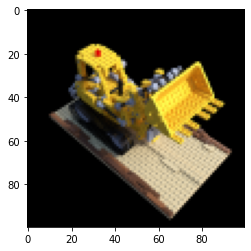

In [4]:
data = np.load('tiny_nerf_data.npz')
images = data['images']
poses = data['poses']
focal = data['focal']

print(f'Images shape: {images.shape}')
print(f'Poses shape: {poses.shape}')
print(f'Focal length: {focal}')

height, width = images.shape[1:3]
near, far = 2., 6.

n_training = 100
testimg_idx = 101
testimg, testpose = images[testimg_idx], poses[testimg_idx]

plt.imshow(testimg)
print('Pose')
print(testpose)

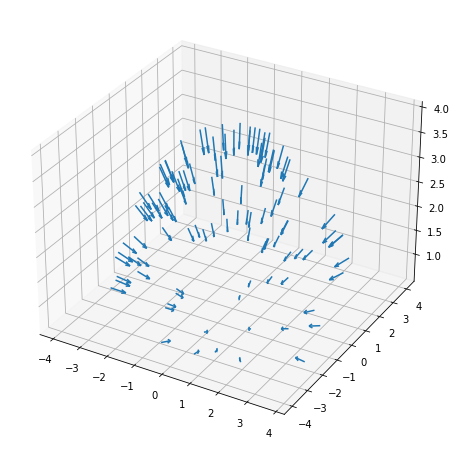

In [5]:
dirs = np.stack([np.sum([0, 0, -1] * pose[:3, :3], axis=-1) for pose in poses])
origins = poses[:, :3, -1]

ax = plt.figure(figsize=(12, 8)).add_subplot(projection='3d')
_ = ax.quiver(
  origins[..., 0].flatten(),
  origins[..., 1].flatten(),
  origins[..., 2].flatten(),
  dirs[..., 0].flatten(),
  dirs[..., 1].flatten(),
  dirs[..., 2].flatten(), length=0.5, normalize=True)
plt.show()

In [6]:
def get_rays(
  height: int,
  width: int,
  focal_length: float,
  c2w: torch.Tensor
) -> Tuple[torch.Tensor, torch.Tensor]:
  r"""
  Find origin and direction of rays through every pixel and camera origin.
  """

  # Apply pinhole camera model to gather directions at each pixel
  i, j = torch.meshgrid(
      torch.arange(width, dtype=torch.float32).to(c2w),
      torch.arange(height, dtype=torch.float32).to(c2w),
      indexing='ij')
  i, j = i.transpose(-1, -2), j.transpose(-1, -2)
  directions = torch.stack([(i - width * .5) / focal_length,
                            -(j - height * .5) / focal_length,
                            -torch.ones_like(i)
                           ], dim=-1)

  # Apply camera pose to directions
  rays_d = torch.sum(directions[..., None, :] * c2w[:3, :3], dim=-1)

  # Origin is same for all directions (the optical center)
  rays_o = c2w[:3, -1].expand(rays_d.shape)
  return rays_o, rays_d

In [7]:
# Gather as torch tensors
images = torch.from_numpy(data['images'][:n_training]).to(device)
poses = torch.from_numpy(data['poses']).to(device)
focal = torch.from_numpy(data['focal']).to(device)
testimg = torch.from_numpy(data['images'][testimg_idx]).to(device)
testpose = torch.from_numpy(data['poses'][testimg_idx]).to(device)

# Grab rays from sample image
height, width = images.shape[1:3]
with torch.no_grad():
  ray_origin, ray_direction = get_rays(height, width, focal, testpose)

print('Ray Origin')
print(ray_origin.shape)
print(ray_origin[height // 2, width // 2, :])
print('')

print('Ray Direction')
print(ray_direction.shape)
print(ray_direction[height // 2, width // 2, :])
print('')

Ray Origin
torch.Size([100, 100, 3])
tensor([-1.9745, -1.8789,  2.9700], device='cuda:0')

Ray Direction
torch.Size([100, 100, 3])
tensor([ 0.4898,  0.4661, -0.7368], device='cuda:0')



In [8]:
def sample_stratified(
  rays_o: torch.Tensor,
  rays_d: torch.Tensor,
  near: float,
  far: float,
  n_samples: int,
  perturb: Optional[bool] = True,
  inverse_depth: bool = False
) -> Tuple[torch.Tensor, torch.Tensor]:
  r"""
  Sample along ray from regularly-spaced bins.
  """

  # Grab samples for space integration along ray
  t_vals = torch.linspace(0., 1., n_samples, device=rays_o.device)
  if not inverse_depth:
    # Sample linearly between `near` and `far`
    z_vals = near * (1.-t_vals) + far * (t_vals)
  else:
    # Sample linearly in inverse depth (disparity)
    z_vals = 1./(1./near * (1.-t_vals) + 1./far * (t_vals))

  # Draw uniform samples from bins along ray
  if perturb:
    mids = .5 * (z_vals[1:] + z_vals[:-1])
    upper = torch.concat([mids, z_vals[-1:]], dim=-1)
    lower = torch.concat([z_vals[:1], mids], dim=-1)
    t_rand = torch.rand([n_samples], device=z_vals.device)
    z_vals = lower + (upper - lower) * t_rand
  z_vals = z_vals.expand(list(rays_o.shape[:-1]) + [n_samples])

  # Apply scale from `rays_d` and offset from `rays_o` to samples
  # pts: (width, height, n_samples, 3)
  pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]
  return pts, z_vals

In [9]:
# Draw stratified samples from example
rays_o = ray_origin.view([-1, 3])
rays_d = ray_direction.view([-1, 3])
n_samples = 8
perturb = True
inverse_depth = False
with torch.no_grad():
  pts, z_vals = sample_stratified(rays_o, rays_d, near, far, n_samples,
                                  perturb=perturb, inverse_depth=inverse_depth)

print('Input Points')
print(pts.shape)
print('')
print('Distances Along Ray')
print(z_vals.shape)

Input Points
torch.Size([10000, 8, 3])

Distances Along Ray
torch.Size([10000, 8])


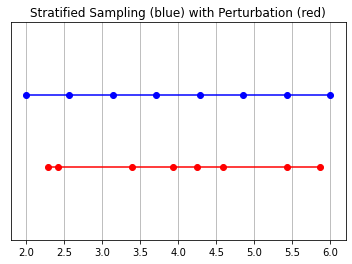

In [10]:
y_vals = torch.zeros_like(z_vals)

_, z_vals_unperturbed = sample_stratified(rays_o, rays_d, near, far, n_samples,
                                  perturb=False, inverse_depth=inverse_depth)
plt.plot(z_vals_unperturbed[0].cpu().numpy(), 1 + y_vals[0].cpu().numpy(), 'b-o')
plt.plot(z_vals[0].cpu().numpy(), y_vals[0].cpu().numpy(), 'r-o')
plt.ylim([-1, 2])
plt.title('Stratified Sampling (blue) with Perturbation (red)')
ax = plt.gca()
ax.axes.yaxis.set_visible(False)
plt.grid(True)

In [11]:
class PositionalEncoder(nn.Module):
  r"""
  Sine-cosine positional encoder for input points.
  """
  def __init__(
    self,
    d_input: int,
    n_freqs: int,
    log_space: bool = False
  ):
    super().__init__()
    self.d_input = d_input
    self.n_freqs = n_freqs
    self.log_space = log_space
    self.d_output = d_input * (1 + 2 * self.n_freqs)
    self.embed_fns = [lambda x: x]

    # Define frequencies in either linear or log scale
    if self.log_space:
      freq_bands = 2.**torch.linspace(0., self.n_freqs - 1, self.n_freqs)
    else:
      freq_bands = torch.linspace(2.**0., 2.**(self.n_freqs - 1), self.n_freqs)

    # Alternate sin and cos
    for freq in freq_bands:
      self.embed_fns.append(lambda x, freq=freq: torch.sin(x * freq))
      self.embed_fns.append(lambda x, freq=freq: torch.cos(x * freq))
  
  def forward(
    self,
    x
  ) -> torch.Tensor:
    r"""
    Apply positional encoding to input.
    """
    return torch.concat([fn(x) for fn in self.embed_fns], dim=-1)


In [12]:
# Create encoders for points and view directions
encoder = PositionalEncoder(3, 10)
viewdirs_encoder = PositionalEncoder(3, 4)

# Grab flattened points and view directions
pts_flattened = pts.reshape(-1, 3)
viewdirs = rays_d / torch.norm(rays_d, dim=-1, keepdim=True)
flattened_viewdirs = viewdirs[:, None, ...].expand(pts.shape).reshape((-1, 3))

# Encode inputs
encoded_points = encoder(pts_flattened)
encoded_viewdirs = viewdirs_encoder(flattened_viewdirs)

print('Encoded Points')
print(encoded_points.shape)
print(torch.min(encoded_points), torch.max(encoded_points), torch.mean(encoded_points))
print('')

print(encoded_viewdirs.shape)
print('Encoded Viewdirs')
print(torch.min(encoded_viewdirs), torch.max(encoded_viewdirs), torch.mean(encoded_viewdirs))
print('')

Encoded Points
torch.Size([80000, 63])
tensor(-2.7563, device='cuda:0') tensor(3.4624, device='cuda:0') tensor(0.0274, device='cuda:0')

torch.Size([80000, 27])
Encoded Viewdirs
tensor(-1., device='cuda:0') tensor(1., device='cuda:0') tensor(0.1056, device='cuda:0')



In [13]:
class NeRF(nn.Module):
  r"""
  Neural radiance fields module.
  """
  def __init__(
    self,
    d_input: int = 3,
    n_layers: int = 8,
    d_filter: int = 256,
    skip: Tuple[int] = (4,),
    d_viewdirs: Optional[int] = None
  ):
    super().__init__()
    self.d_input = d_input
    self.skip = skip
    self.act = nn.functional.relu
    self.d_viewdirs = d_viewdirs

    # Create model layers
    self.layers = nn.ModuleList(
      [nn.Linear(self.d_input, d_filter)] +
      [nn.Linear(d_filter + self.d_input, d_filter) if i in skip \
       else nn.Linear(d_filter, d_filter) for i in range(n_layers - 1)]
    )

    # Bottleneck layers
    if self.d_viewdirs is not None:
      # If using viewdirs, split alpha and RGB
      self.alpha_out = nn.Linear(d_filter, 1)
      self.rgb_filters = nn.Linear(d_filter, d_filter)
      self.branch = nn.Linear(d_filter + self.d_viewdirs, d_filter // 2)
      self.output = nn.Linear(d_filter // 2, 3)
    else:
      # If no viewdirs, use simpler output
      self.output = nn.Linear(d_filter, 4)
  
  def forward(
    self,
    x: torch.Tensor,
    viewdirs: Optional[torch.Tensor] = None
  ) -> torch.Tensor:
    r"""
    Forward pass with optional view direction.
    """

    # Cannot use viewdirs if instantiated with d_viewdirs = None
    if self.d_viewdirs is None and viewdirs is not None:
      raise ValueError('Cannot input x_direction if d_viewdirs was not given.')

    # Apply forward pass up to bottleneck
    x_input = x
    for i, layer in enumerate(self.layers):
      x = self.act(layer(x))
      if i in self.skip:
        x = torch.cat([x, x_input], dim=-1)

    # Apply bottleneck
    if self.d_viewdirs is not None:
      # Split alpha from network output
      alpha = self.alpha_out(x)

      # Pass through bottleneck to get RGB
      x = self.rgb_filters(x)
      x = torch.concat([x, viewdirs], dim=-1)
      x = self.act(self.branch(x))
      x = self.output(x)

      # Concatenate alphas to output
      x = torch.concat([x, alpha], dim=-1)
    else:
      # Simple output
      x = self.output(x)
    return x

In [14]:
def cumprod_exclusive(
  tensor: torch.Tensor
) -> torch.Tensor:
  r"""
  (Courtesy of https://github.com/krrish94/nerf-pytorch)

  Mimick functionality of tf.math.cumprod(..., exclusive=True), as it isn't available in PyTorch.

  Args:
  tensor (torch.Tensor): Tensor whose cumprod (cumulative product, see `torch.cumprod`) along dim=-1
    is to be computed.
  Returns:
  cumprod (torch.Tensor): cumprod of Tensor along dim=-1, mimiciking the functionality of
    tf.math.cumprod(..., exclusive=True) (see `tf.math.cumprod` for details).
  """

  # Compute regular cumprod first (this is equivalent to `tf.math.cumprod(..., exclusive=False)`).
  cumprod = torch.cumprod(tensor, -1)
  # "Roll" the elements along dimension 'dim' by 1 element.
  cumprod = torch.roll(cumprod, 1, -1)
  # Replace the first element by "1" as this is what tf.cumprod(..., exclusive=True) does.
  cumprod[..., 0] = 1.
  
  return cumprod



def raw2outputs(
  raw: torch.Tensor,
  z_vals: torch.Tensor,
  rays_d: torch.Tensor,
  raw_noise_std: float = 0.0,
  white_bkgd: bool = False
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
  r"""
  Convert the raw NeRF output into RGB and other maps.
  """

  # Difference between consecutive elements of `z_vals`. [n_rays, n_samples]
  dists = z_vals[..., 1:] - z_vals[..., :-1]
  dists = torch.cat([dists, 1e10 * torch.ones_like(dists[..., :1])], dim=-1)

  # Multiply each distance by the norm of its corresponding direction ray
  # to convert to real world distance (accounts for non-unit directions).
  dists = dists * torch.norm(rays_d[..., None, :], dim=-1)

  # Add noise to model's predictions for density. Can be used to 
  # regularize network during training (prevents floater artifacts).
  noise = 0.
  if raw_noise_std > 0.:
    noise = torch.randn(raw[..., 3].shape) * raw_noise_std

  # Predict density of each sample along each ray. Higher values imply
  # higher likelihood of being absorbed at this point. [n_rays, n_samples]
  sigmoid = nn.Sigmoid()
  alpha = sigmoid((nn.functional.relu(raw[..., 3] + noise) * dists))

  # Compute weight for RGB of each sample along each ray. [n_rays, n_samples]
  # The higher the alpha, the lower subsequent weights are driven.
  weights = alpha

  # Compute weighted RGB map.
  rgb = torch.sigmoid(raw[..., :3])  # [n_rays, n_samples, 3]
  rgb_map = torch.sum(weights[..., None] * rgb, dim=-2)  # [n_rays, 3]

  # Estimated depth map is predicted distance.
  depth_map = torch.sum(weights * z_vals, dim=-1)

  # Disparity map is inverse depth.
  disp_map = 1. / torch.max(1e-10 * torch.ones_like(depth_map),
                            depth_map / torch.sum(weights, -1))

  # Sum of weights along each ray. In [0, 1] up to numerical error.
  acc_map = torch.sum(weights, dim=-1)

  # To composite onto a white background, use the accumulated alpha map.
  if white_bkgd:
    rgb_map = rgb_map + (1. - acc_map[..., None])

  return rgb_map, depth_map, acc_map, weights

In [15]:
def sample_pdf(
  bins: torch.Tensor,
  weights: torch.Tensor,
  n_samples: int,
  perturb: bool = False
) -> torch.Tensor:
  r"""
  Apply inverse transform sampling to a weighted set of points.
  """

  # Normalize weights to get PDF.
  pdf = (weights + 1e-5) / torch.sum(weights + 1e-5, -1, keepdims=True) # [n_rays, weights.shape[-1]]

  # Convert PDF to CDF.
  cdf = torch.cumsum(pdf, dim=-1) # [n_rays, weights.shape[-1]]
  cdf = torch.concat([torch.zeros_like(cdf[..., :1]), cdf], dim=-1) # [n_rays, weights.shape[-1] + 1]

  # Take sample positions to grab from CDF. Linear when perturb == 0.
  if not perturb:
    u = torch.linspace(0., 1., n_samples, device=cdf.device)
    u = u.expand(list(cdf.shape[:-1]) + [n_samples]) # [n_rays, n_samples]
  else:
    u = torch.rand(list(cdf.shape[:-1]) + [n_samples], device=cdf.device) # [n_rays, n_samples]

  # Find indices along CDF where values in u would be placed.
  u = u.contiguous() # Returns contiguous tensor with same values.
  inds = torch.searchsorted(cdf, u, right=True) # [n_rays, n_samples]

  # Clamp indices that are out of bounds.
  below = torch.clamp(inds - 1, min=0)
  above = torch.clamp(inds, max=cdf.shape[-1] - 1)
  inds_g = torch.stack([below, above], dim=-1) # [n_rays, n_samples, 2]

  # Sample from cdf and the corresponding bin centers.
  matched_shape = list(inds_g.shape[:-1]) + [cdf.shape[-1]]
  cdf_g = torch.gather(cdf.unsqueeze(-2).expand(matched_shape), dim=-1,
                       index=inds_g)
  bins_g = torch.gather(bins.unsqueeze(-2).expand(matched_shape), dim=-1,
                        index=inds_g)

  # Convert samples to ray length.
  denom = (cdf_g[..., 1] - cdf_g[..., 0])
  denom = torch.where(denom < 1e-5, torch.ones_like(denom), denom)
  t = (u - cdf_g[..., 0]) / denom
  samples = bins_g[..., 0] + t * (bins_g[..., 1] - bins_g[..., 0])

  return samples # [n_rays, n_samples]

In [16]:
def sample_hierarchical(
  rays_o: torch.Tensor,
  rays_d: torch.Tensor,
  z_vals: torch.Tensor,
  weights: torch.Tensor,
  n_samples: int,
  perturb: bool = False
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
  r"""
  Apply hierarchical sampling to the rays.
  """

  # Draw samples from PDF using z_vals as bins and weights as probabilities.
  z_vals_mid = .5 * (z_vals[..., 1:] + z_vals[..., :-1])
  new_z_samples = sample_pdf(z_vals_mid, weights[..., 1:-1], n_samples,
                          perturb=perturb)
  new_z_samples = new_z_samples.detach()

  # Resample points from ray based on PDF.
  z_vals_combined, _ = torch.sort(torch.cat([z_vals, new_z_samples], dim=-1), dim=-1)
  pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals_combined[..., :, None]  # [N_rays, N_samples + n_samples, 3]
  return pts, z_vals_combined, new_z_samples

In [17]:
def get_chunks(
  inputs: torch.Tensor,
  chunksize: int = 2**15
) -> List[torch.Tensor]:
  r"""
  Divide an input into chunks.
  """
  return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

def prepare_chunks(
  points: torch.Tensor,
  encoding_function: Callable[[torch.Tensor], torch.Tensor],
  chunksize: int = 2**15
) -> List[torch.Tensor]:
  r"""
  Encode and chunkify points to prepare for NeRF model.
  """
  points = points.reshape((-1, 3))
  points = encoding_function(points)
  points = get_chunks(points, chunksize=chunksize)
  return points

def prepare_viewdirs_chunks(
  points: torch.Tensor,
  rays_d: torch.Tensor,
  encoding_function: Callable[[torch.Tensor], torch.Tensor],
  chunksize: int = 2**15
) -> List[torch.Tensor]:
  r"""
  Encode and chunkify viewdirs to prepare for NeRF model.
  """
  # Prepare the viewdirs
  viewdirs = rays_d / torch.norm(rays_d, dim=-1, keepdim=True)
  viewdirs = viewdirs[:, None, ...].expand(points.shape).reshape((-1, 3))
  viewdirs = encoding_function(viewdirs)
  viewdirs = get_chunks(viewdirs, chunksize=chunksize)
  return viewdirs

In [18]:
def nerf_forward(
  rays_o: torch.Tensor,
  rays_d: torch.Tensor,
  near: float,
  far: float,
  encoding_fn: Callable[[torch.Tensor], torch.Tensor],
  coarse_model: nn.Module,
  kwargs_sample_stratified: dict = None,
  n_samples_hierarchical: int = 0,
  kwargs_sample_hierarchical: dict = None,
  fine_model = None,
  viewdirs_encoding_fn: Optional[Callable[[torch.Tensor], torch.Tensor]] = None,
  chunksize: int = 2**15
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, dict]:
  r"""
  Compute forward pass through model(s).
  """

  # Set no kwargs if none are given.
  if kwargs_sample_stratified is None:
    kwargs_sample_stratified = {}
  if kwargs_sample_hierarchical is None:
    kwargs_sample_hierarchical = {}
  
  # Sample query points along each ray.
  query_points, z_vals = sample_stratified(
      rays_o, rays_d, near, far, **kwargs_sample_stratified)

  # Prepare batches.
  batches = prepare_chunks(query_points, encoding_fn, chunksize=chunksize)
  if viewdirs_encoding_fn is not None:
    batches_viewdirs = prepare_viewdirs_chunks(query_points, rays_d,
                                               viewdirs_encoding_fn,
                                               chunksize=chunksize)
  else:
    batches_viewdirs = [None] * len(batches)

  # Coarse model pass.
  # Split the encoded points into "chunks", run the model on all chunks, and
  # concatenate the results (to avoid out-of-memory issues).
  predictions = []
  for batch, batch_viewdirs in zip(batches, batches_viewdirs):
    predictions.append(coarse_model(batch, viewdirs=batch_viewdirs))
  raw = torch.cat(predictions, dim=0)
  raw = raw.reshape(list(query_points.shape[:2]) + [raw.shape[-1]])

  # Perform differentiable volume rendering to re-synthesize the RGB image.
  rgb_map, depth_map, acc_map, weights = raw2outputs(raw, z_vals, rays_d)
  # rgb_map, depth_map, acc_map, weights = render_volume_density(raw, rays_o, z_vals)
  outputs = {
      'z_vals_stratified': z_vals
  }

  # Fine model pass.
  if n_samples_hierarchical > 0:
    # Save previous outputs to return.
    rgb_map_0, depth_map_0, acc_map_0 = rgb_map, depth_map, acc_map

    # Apply hierarchical sampling for fine query points.
    query_points, z_vals_combined, z_hierarch = sample_hierarchical(
      rays_o, rays_d, z_vals, weights, n_samples_hierarchical,
      **kwargs_sample_hierarchical)

    # Prepare inputs as before.
    batches = prepare_chunks(query_points, encoding_fn, chunksize=chunksize)
    if viewdirs_encoding_fn is not None:
      batches_viewdirs = prepare_viewdirs_chunks(query_points, rays_d,
                                                 viewdirs_encoding_fn,
                                                 chunksize=chunksize)
    else:
      batches_viewdirs = [None] * len(batches)

    # Forward pass new samples through fine model.
    fine_model = fine_model if fine_model is not None else coarse_model
    predictions = []
    for batch, batch_viewdirs in zip(batches, batches_viewdirs):
      predictions.append(fine_model(batch, viewdirs=batch_viewdirs))
    raw = torch.cat(predictions, dim=0)
    raw = raw.reshape(list(query_points.shape[:2]) + [raw.shape[-1]])

    # Perform differentiable volume rendering to re-synthesize the RGB image.
    rgb_map, depth_map, acc_map, weights = raw2outputs(raw, z_vals_combined, rays_d)
    
    # Store outputs.
    outputs['z_vals_hierarchical'] = z_hierarch
    outputs['rgb_map_0'] = rgb_map_0
    outputs['depth_map_0'] = depth_map_0
    outputs['acc_map_0'] = acc_map_0

  # Store outputs.
  outputs['rgb_map'] = rgb_map
  outputs['depth_map'] = depth_map
  outputs['acc_map'] = acc_map
  outputs['weights'] = weights
  return outputs

In [19]:
# Encoders
d_input = 3           # Number of input dimensions
n_freqs = 10          # Number of encoding functions for samples
log_space = True      # If set, frequencies scale in log space
use_viewdirs = True   # If set, use view direction as input
n_freqs_views = 4     # Number of encoding functions for views

# Stratified sampling
n_samples = 64         # Number of spatial samples per ray
perturb = True         # If set, applies noise to sample positions
inverse_depth = False  # If set, samples points linearly in inverse depth

# Model
d_filter = 128          # Dimensions of linear layer filters
n_layers = 2            # Number of layers in network bottleneck
skip = []               # Layers at which to apply input residual
use_fine_model = True   # If set, creates a fine model
d_filter_fine = 128     # Dimensions of linear layer filters of fine network
n_layers_fine = 6       # Number of layers in fine network bottleneck

# Hierarchical sampling
n_samples_hierarchical = 64   # Number of samples per ray
perturb_hierarchical = False  # If set, applies noise to sample positions

# Optimizer
lr = 5e-4  # Learning rate

# Training
n_iters = 10000
batch_size = 2**14          # Number of rays per gradient step (power of 2)
one_image_per_step = True   # One image per gradient step (disables batching)
chunksize = 2**14           # Modify as needed to fit in GPU memory
center_crop = True          # Crop the center of image (one_image_per_)
center_crop_iters = 50      # Stop cropping center after this many epochs
display_rate = 25          # Display test output every X epochs

# Early Stopping
warmup_iters = 100          # Number of iterations during warmup phase
warmup_min_fitness = 10.0   # Min val PSNR to continue training at warmup_iters
n_restarts = 10             # Number of times to restart if training stalls

# We bundle the kwargs for various functions to pass all at once.
kwargs_sample_stratified = {
    'n_samples': n_samples,
    'perturb': perturb,
    'inverse_depth': inverse_depth
}
kwargs_sample_hierarchical = {
    'perturb': perturb
}

In [20]:
def plot_samples(
  z_vals: torch.Tensor,
  z_hierarch: Optional[torch.Tensor] = None,
  ax: Optional[np.ndarray] = None):
  r"""
  Plot stratified and (optional) hierarchical samples.
  """
  y_vals = 1 + np.zeros_like(z_vals)

  if ax is None:
    ax = plt.subplot()
  ax.plot(z_vals, y_vals, 'b-o')
  if z_hierarch is not None:
    y_hierarch = np.zeros_like(z_hierarch)
    ax.plot(z_hierarch, y_hierarch, 'r-o')
  ax.set_ylim([-1, 2])
  ax.set_title('Stratified  Samples (blue) and Hierarchical Samples (red)')
  ax.axes.yaxis.set_visible(False)
  ax.grid(True)
  return ax

def crop_center(
  img: torch.Tensor,
  frac: float = 0.5
) -> torch.Tensor:
  r"""
  Crop center square from image.
  """
  h_offset = round(img.shape[0] * (frac / 2))
  w_offset = round(img.shape[1] * (frac / 2))
  return img[h_offset:-h_offset, w_offset:-w_offset]

class EarlyStopping:
  r"""
  Early stopping helper based on fitness criterion.
  """
  def __init__(
    self,
    patience: int = 30,
    margin: float = 1e-4
  ):
    self.best_fitness = 0.0  # In our case PSNR
    self.best_iter = 0
    self.margin = margin
    self.patience = patience or float('inf')  # epochs to wait after fitness stops improving to stop

  def __call__(
    self,
    iter: int,
    fitness: float
  ):
    r"""
    Check if criterion for stopping is met.
    """
    if (fitness - self.best_fitness) > self.margin:
      self.best_iter = iter
      self.best_fitness = fitness
    delta = iter - self.best_iter
    stop = delta >= self.patience  # stop training if patience exceeded
    return stop

In [21]:
def init_models():
  r"""
  Initialize models, encoders, and optimizer for NeRF training.
  """
  # Encoders
  encoder = PositionalEncoder(d_input, n_freqs, log_space=log_space)
  encode = lambda x: encoder(x)

  # View direction encoders
  if use_viewdirs:
    encoder_viewdirs = PositionalEncoder(d_input, n_freqs_views,
                                        log_space=log_space)
    encode_viewdirs = lambda x: encoder_viewdirs(x)
    d_viewdirs = encoder_viewdirs.d_output
  else:
    encode_viewdirs = None
    d_viewdirs = None

  # Models
  model = NeRF(encoder.d_output, n_layers=n_layers, d_filter=d_filter, skip=skip,
              d_viewdirs=d_viewdirs)
  model.to(device)
  model_params = list(model.parameters())
  if use_fine_model:
    fine_model = NeRF(encoder.d_output, n_layers=n_layers, d_filter=d_filter, skip=skip,
                      d_viewdirs=d_viewdirs)
    fine_model.to(device)
    model_params = model_params + list(fine_model.parameters())
  else:
    fine_model = None

  # Optimizer
  optimizer = torch.optim.Adam(model_params, lr=lr)

  # Early Stopping
  warmup_stopper = EarlyStopping(patience=50)

  return model, fine_model, encode, encode_viewdirs, optimizer, warmup_stopper

In [22]:
def train():
  r"""
  Launch training session for NeRF.
  """
  # Shuffle rays across all images.
  if not one_image_per_step:
    height, width = images.shape[1:3]
    all_rays = torch.stack([torch.stack(get_rays(height, width, focal, p), 0)
                        for p in poses[:n_training]], 0)
    rays_rgb = torch.cat([all_rays, images[:, None]], 1)
    rays_rgb = torch.permute(rays_rgb, [0, 2, 3, 1, 4])
    rays_rgb = rays_rgb.reshape([-1, 3, 3])
    rays_rgb = rays_rgb.type(torch.float32)
    rays_rgb = rays_rgb[torch.randperm(rays_rgb.shape[0])]
    i_batch = 0

  train_psnrs = []
  val_psnrs = []
  iternums = []
  for i in trange(n_iters):
    model.train()

    if one_image_per_step:
      # Randomly pick an image as the target.
      target_img_idx = np.random.randint(images.shape[0])
      target_img = images[target_img_idx].to(device)
      if center_crop and i < center_crop_iters:
        target_img = crop_center(target_img)
      height, width = target_img.shape[:2]
      target_pose = poses[target_img_idx].to(device)
      rays_o, rays_d = get_rays(height, width, focal, target_pose)
      rays_o = rays_o.reshape([-1, 3])
      rays_d = rays_d.reshape([-1, 3])
    else:
      # Random over all images.
      batch = rays_rgb[i_batch:i_batch + batch_size]
      batch = torch.transpose(batch, 0, 1)
      rays_o, rays_d, target_img = batch
      height, width = target_img.shape[:2]
      i_batch += batch_size
      # Shuffle after one epoch
      if i_batch >= rays_rgb.shape[0]:
          rays_rgb = rays_rgb[torch.randperm(rays_rgb.shape[0])]
          i_batch = 0
    target_img = target_img.reshape([-1, 3])

    # Run one iteration of TinyNeRF and get the rendered RGB image.
    outputs = nerf_forward(rays_o, rays_d,
                           near, far, encode, model,
                           kwargs_sample_stratified=kwargs_sample_stratified,
                           n_samples_hierarchical=n_samples_hierarchical,
                           kwargs_sample_hierarchical=kwargs_sample_hierarchical,
                           fine_model=fine_model,
                           viewdirs_encoding_fn=encode_viewdirs,
                           chunksize=chunksize)
    
    # Check for any numerical issues.
    for k, v in outputs.items():
      if torch.isnan(v).any():
        print(f"! [Numerical Alert] {k} contains NaN.")
      if torch.isinf(v).any():
        print(f"! [Numerical Alert] {k} contains Inf.")

    # Backprop!
    rgb_predicted = outputs['rgb_map']
    loss = torch.nn.functional.mse_loss(rgb_predicted, target_img)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    # Compute mean-squared error between predicted and target images.
    psnr = -10. * torch.log10(loss)
    train_psnrs.append(psnr.item())

    # Evaluate testimg at given display rate.
    if i % display_rate == 0:
      model.eval()
      height, width = testimg.shape[:2]
      rays_o, rays_d = get_rays(height, width, focal, testpose)
      rays_o = rays_o.reshape([-1, 3])
      rays_d = rays_d.reshape([-1, 3])
      outputs = nerf_forward(rays_o, rays_d,
                             near, far, encode, model,
                             kwargs_sample_stratified=kwargs_sample_stratified,
                             n_samples_hierarchical=n_samples_hierarchical,
                             kwargs_sample_hierarchical=kwargs_sample_hierarchical,
                             fine_model=fine_model,
                             viewdirs_encoding_fn=encode_viewdirs,
                             chunksize=chunksize)

      rgb_predicted = outputs['rgb_map']
      loss = torch.nn.functional.mse_loss(rgb_predicted, testimg.reshape(-1, 3))
      print("Loss:", loss.item())
      val_psnr = -10. * torch.log10(loss)
      
      val_psnrs.append(val_psnr.item())
      iternums.append(i)

      # Plot example outputs
      fig, ax = plt.subplots(1, 4, figsize=(24,4), gridspec_kw={'width_ratios': [1, 1, 1, 3]})
      ax[0].imshow(rgb_predicted.reshape([height, width, 3]).detach().cpu().numpy())
      ax[0].set_title(f'Iteration: {i}')
      ax[1].imshow(testimg.detach().cpu().numpy())
      ax[1].set_title(f'Target')
      ax[2].plot(range(0, i + 1), train_psnrs, 'r')
      ax[2].plot(iternums, val_psnrs, 'b')
      ax[2].set_title('PSNR (train=red, val=blue')
      z_vals_strat = outputs['z_vals_stratified'].view((-1, n_samples))
      z_sample_strat = z_vals_strat[z_vals_strat.shape[0] // 2].detach().cpu().numpy()
      if 'z_vals_hierarchical' in outputs:
        z_vals_hierarch = outputs['z_vals_hierarchical'].view((-1, n_samples_hierarchical))
        z_sample_hierarch = z_vals_hierarch[z_vals_hierarch.shape[0] // 2].detach().cpu().numpy()
      else:
        z_sample_hierarch = None
      _ = plot_samples(z_sample_strat, z_sample_hierarch, ax=ax[3])
      ax[3].margins(0)
      plt.show()

    # Check PSNR for issues and stop if any are found.
    if i == warmup_iters - 1:
      if val_psnr < warmup_min_fitness:
        print(f'Val PSNR {val_psnr} below warmup_min_fitness {warmup_min_fitness}. Stopping...')
        return False, train_psnrs, val_psnrs
    elif i < warmup_iters:
      if warmup_stopper is not None and warmup_stopper(i, psnr):
        print(f'Train PSNR flatlined at {psnr} for {warmup_stopper.patience} iters. Stopping...')
        return False, train_psnrs, val_psnrs
    
  return True, train_psnrs, val_psnrs

  0%|          | 0/10000 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Loss: 893.8320922851562


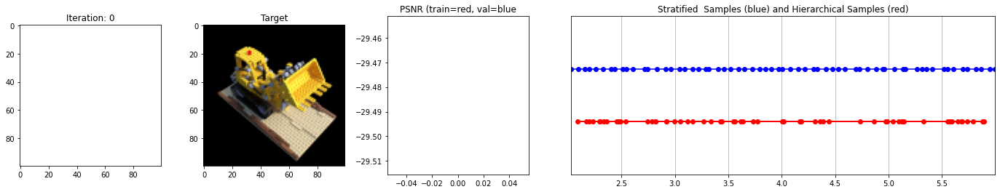

  0%|          | 25/10000 [00:02<10:33, 15.75it/s] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Loss: 80.27366638183594


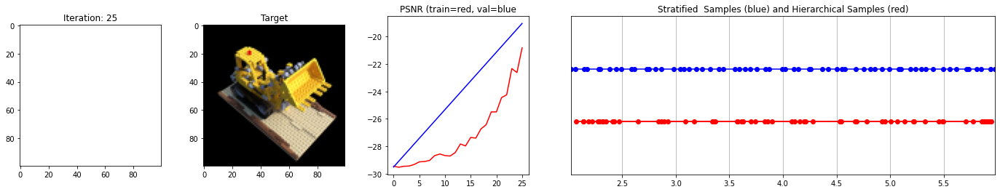

  0%|          | 49/10000 [00:04<10:32, 15.73it/s]

Loss: 0.0910983607172966


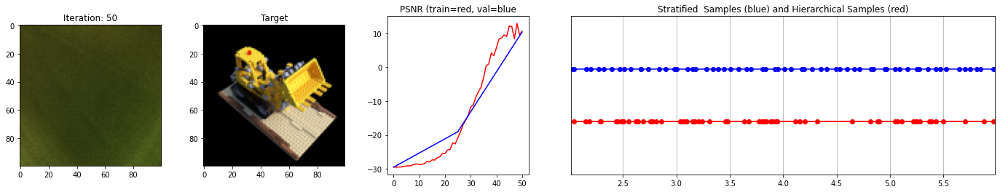

  1%|          | 75/10000 [00:10<40:13,  4.11it/s]

Loss: 0.09231722354888916


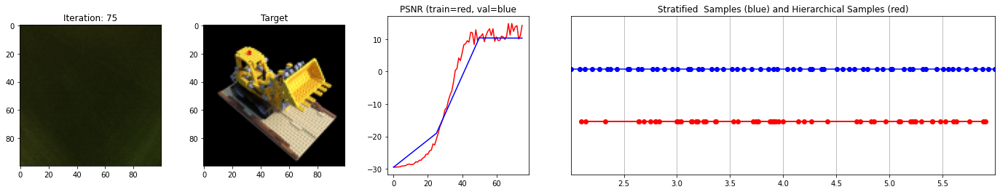

  1%|          | 100/10000 [00:17<40:06,  4.11it/s] 

Loss: 0.09301312267780304


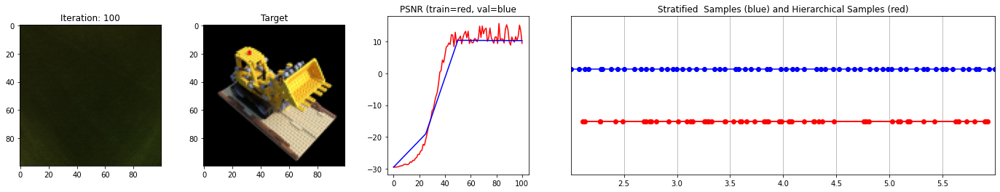

  1%|▏         | 125/10000 [00:23<40:00,  4.11it/s]  

Loss: 0.09311716258525848


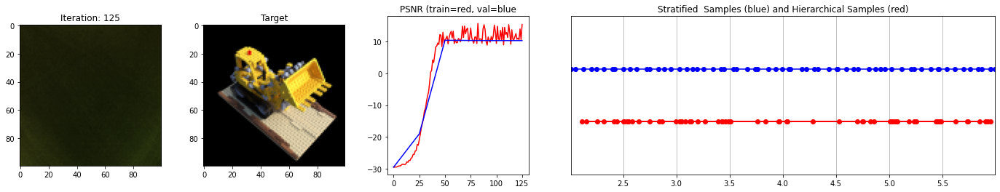

  2%|▏         | 150/10000 [00:30<39:50,  4.12it/s]  

Loss: 0.0930812656879425


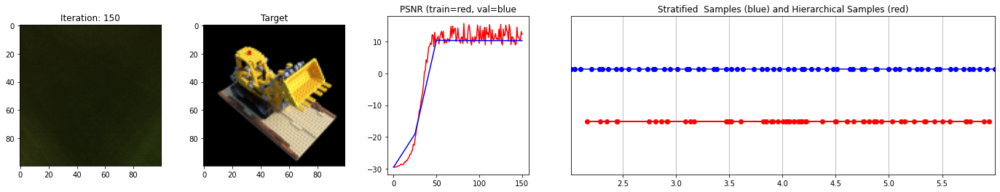

  2%|▏         | 175/10000 [00:36<39:47,  4.12it/s]  

Loss: 0.09312678873538971


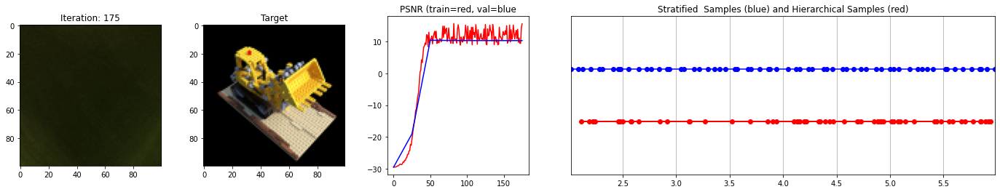

  2%|▏         | 200/10000 [00:43<39:41,  4.11it/s]  

Loss: 0.0930006355047226


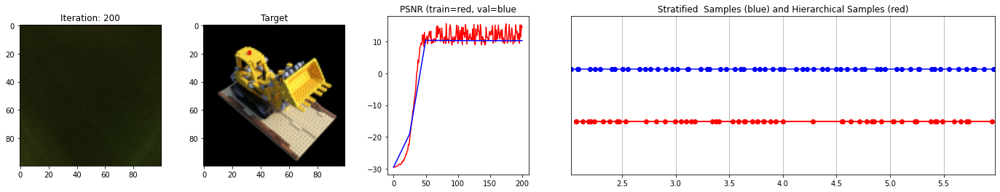

  2%|▏         | 225/10000 [00:50<39:35,  4.11it/s]  

Loss: 0.09301110357046127


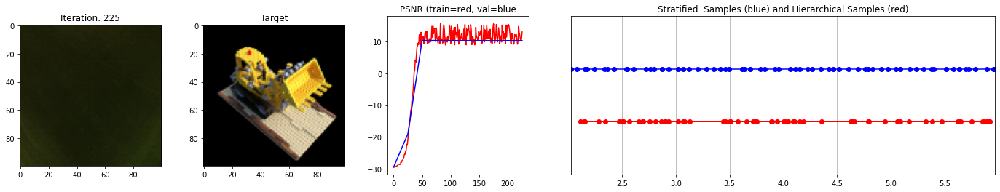

  2%|▎         | 250/10000 [00:56<39:28,  4.12it/s]  

Loss: 0.09303858876228333


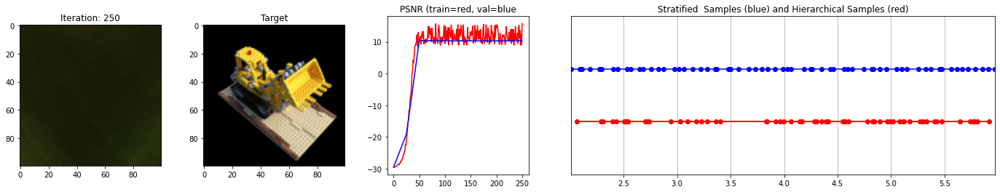

  3%|▎         | 275/10000 [01:03<39:21,  4.12it/s]  

Loss: 0.0930585265159607


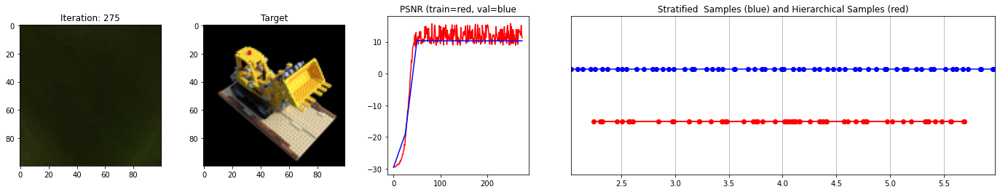

  3%|▎         | 300/10000 [01:09<39:15,  4.12it/s]  

Loss: 0.0929715484380722


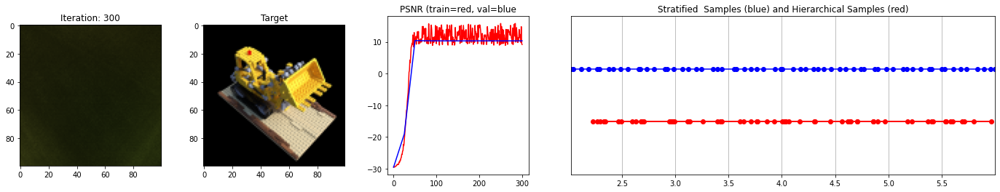

  3%|▎         | 325/10000 [01:16<39:09,  4.12it/s]  

Loss: 0.09288259595632553


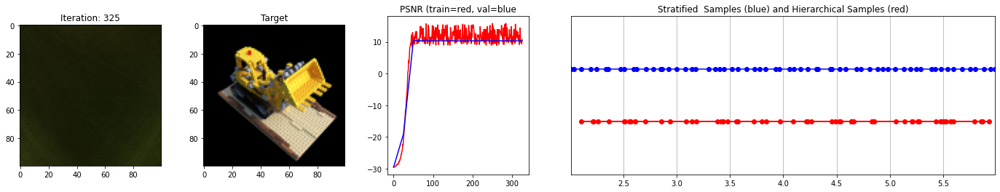

  4%|▎         | 350/10000 [01:22<39:04,  4.12it/s]  

Loss: 0.09289488941431046


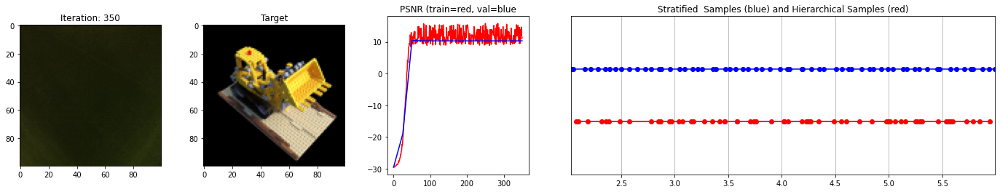

  4%|▍         | 375/10000 [01:29<38:58,  4.12it/s]  

Loss: 0.0928136557340622


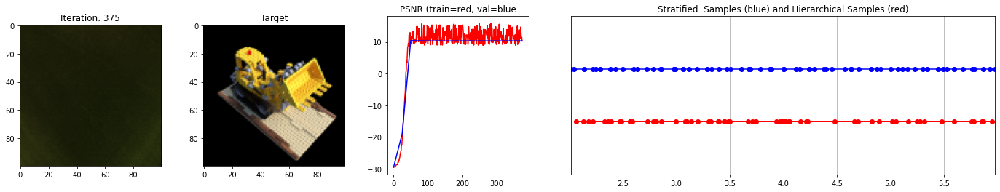

  4%|▍         | 400/10000 [01:35<38:52,  4.12it/s]  

Loss: 0.09281585365533829


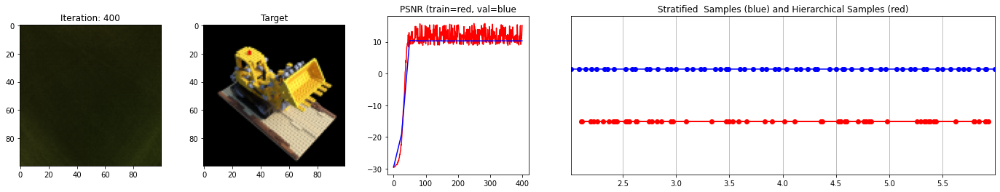

  4%|▍         | 425/10000 [01:42<38:44,  4.12it/s]  

Loss: 0.09266151487827301


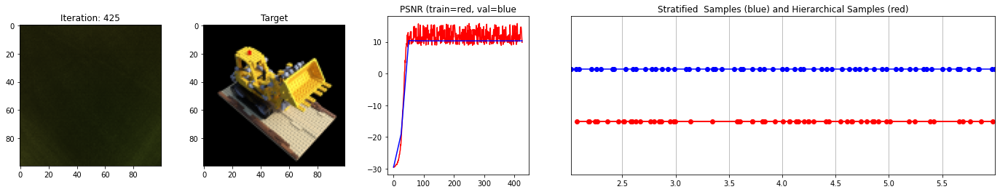

  4%|▍         | 450/10000 [01:48<38:40,  4.12it/s]  

Loss: 0.0927555114030838


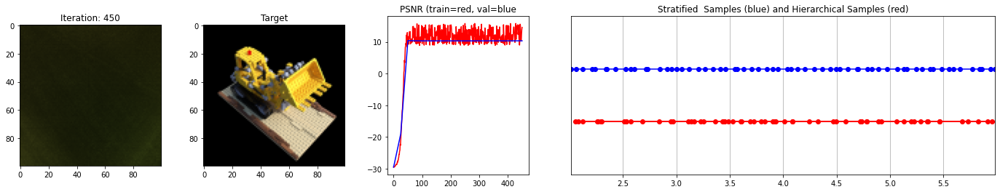

  5%|▍         | 475/10000 [01:55<38:34,  4.11it/s]  

Loss: 0.0928182601928711


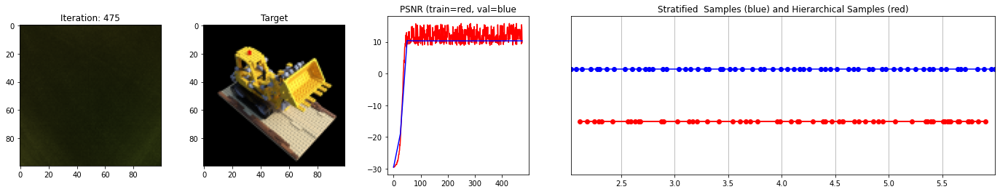

  5%|▌         | 500/10000 [02:02<38:28,  4.11it/s]

Loss: 0.09273696690797806


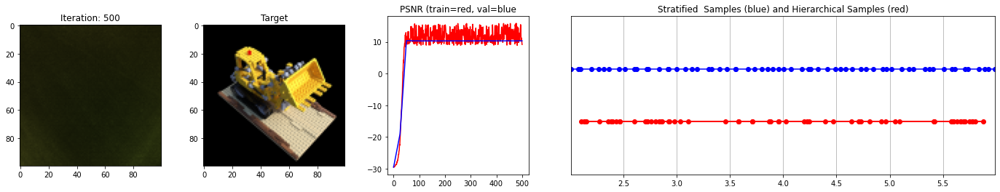

  5%|▌         | 525/10000 [02:08<38:20,  4.12it/s]

Loss: 0.09263686090707779


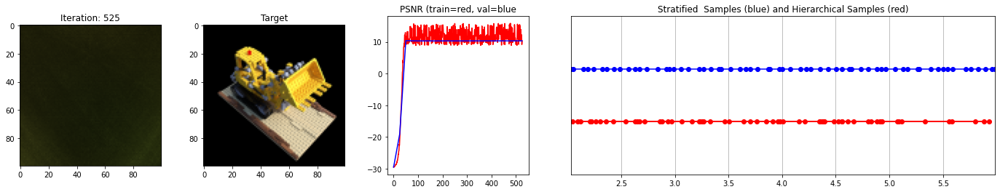

  6%|▌         | 550/10000 [02:15<38:16,  4.11it/s]

Loss: 0.09266185015439987


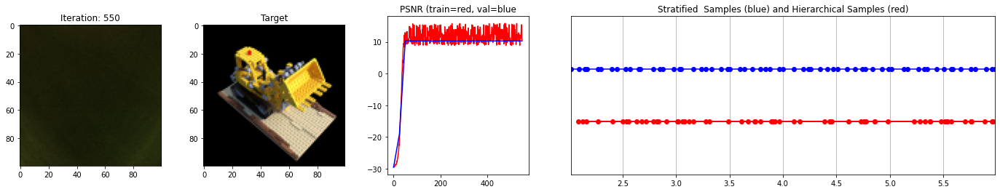

  6%|▌         | 575/10000 [02:21<38:10,  4.12it/s]  

Loss: 0.09265904873609543


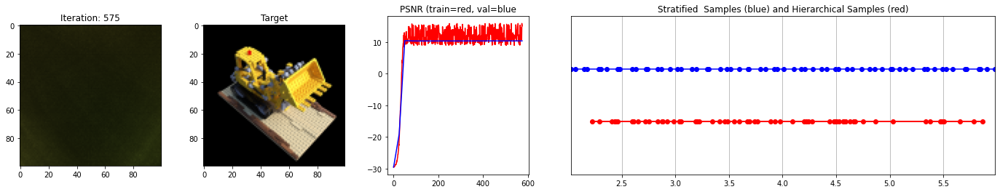

  6%|▌         | 600/10000 [02:28<38:02,  4.12it/s]

Loss: 0.09262856841087341


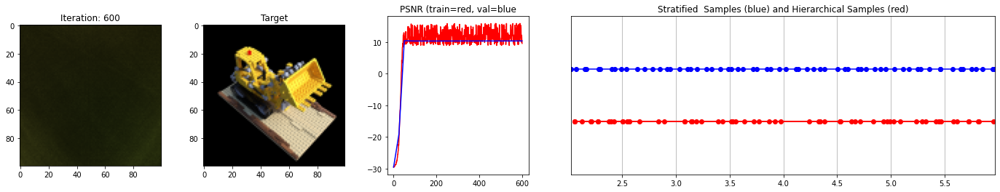

  6%|▋         | 625/10000 [02:34<37:55,  4.12it/s]

Loss: 0.09255830198526382


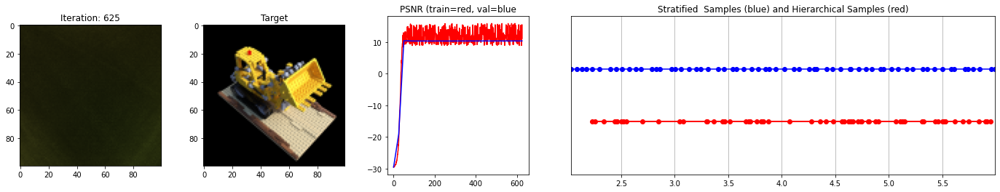

  6%|▋         | 650/10000 [02:41<37:52,  4.11it/s]

Loss: 0.09254272282123566


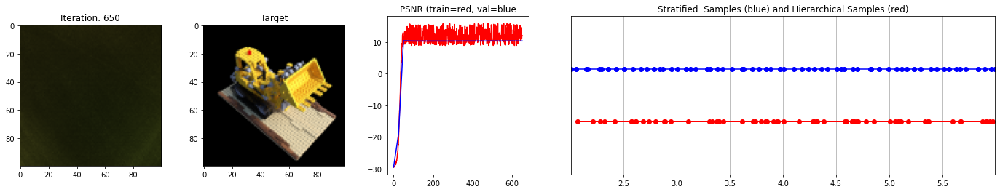

  7%|▋         | 675/10000 [02:47<37:46,  4.11it/s]  

Loss: 0.09262200444936752


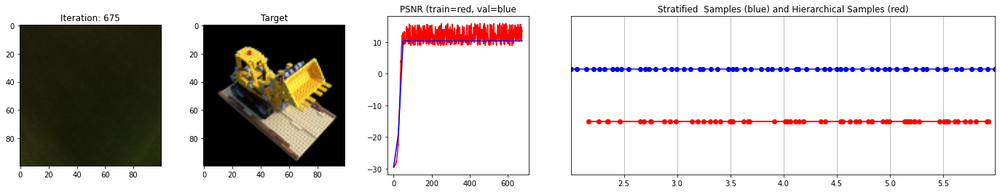

  7%|▋         | 700/10000 [02:54<37:39,  4.12it/s]

Loss: 0.092680923640728


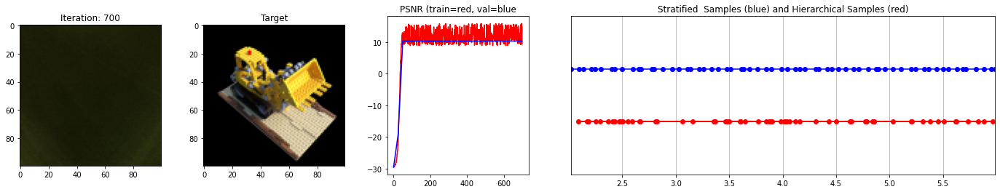

  7%|▋         | 725/10000 [03:00<37:33,  4.12it/s]

Loss: 0.09253896772861481


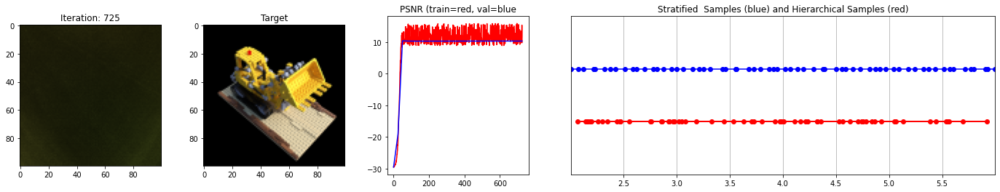

  8%|▊         | 750/10000 [03:07<37:26,  4.12it/s]

Loss: 0.09258945286273956


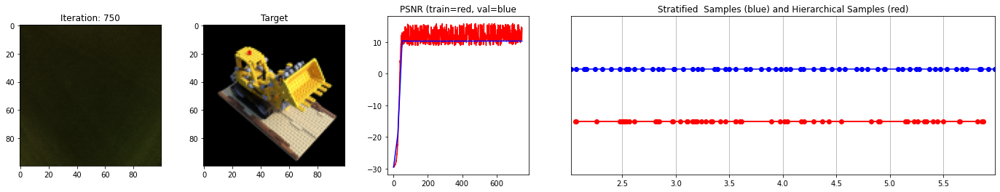

  8%|▊         | 775/10000 [03:13<37:20,  4.12it/s]  

Loss: 0.09251214563846588


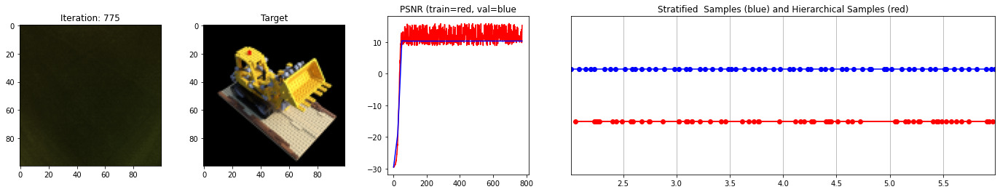

  8%|▊         | 800/10000 [03:20<37:14,  4.12it/s]

Loss: 0.09231331944465637


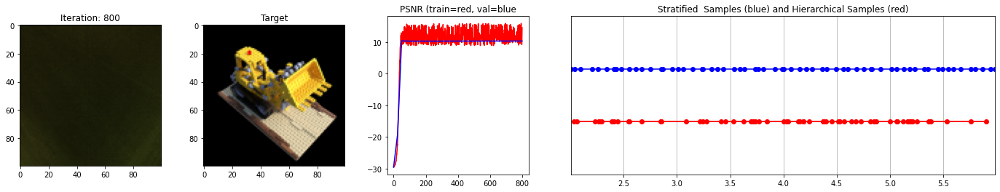

  8%|▊         | 825/10000 [03:27<37:08,  4.12it/s]

Loss: 0.0923183411359787


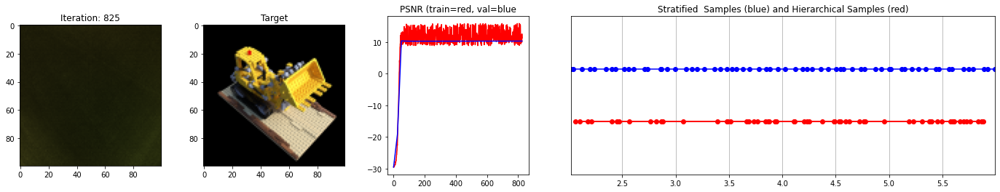

  8%|▊         | 850/10000 [03:33<37:00,  4.12it/s]

Loss: 0.09219353646039963


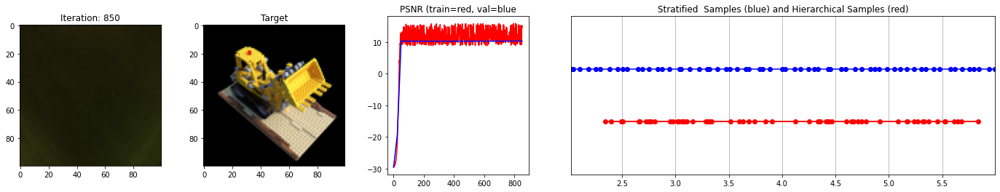

  9%|▉         | 875/10000 [03:40<36:56,  4.12it/s]  

Loss: 0.092226542532444


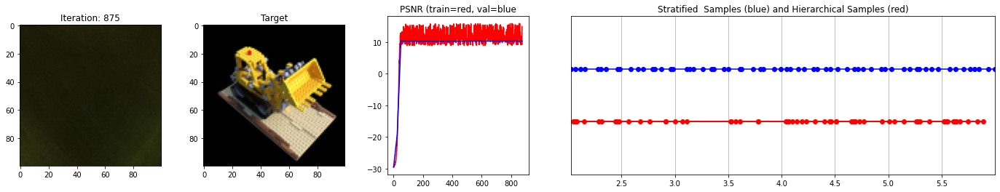

  9%|▉         | 900/10000 [03:46<36:50,  4.12it/s]

Loss: 0.09210336953401566


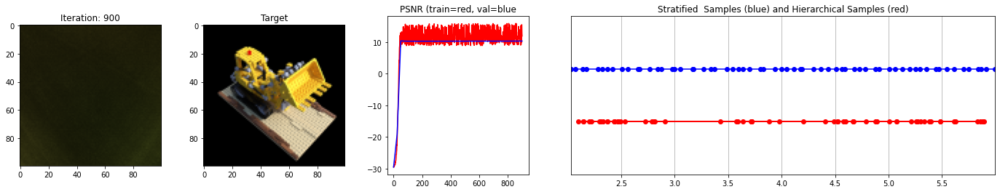

  9%|▉         | 925/10000 [03:53<36:45,  4.11it/s]

Loss: 0.09211304038763046


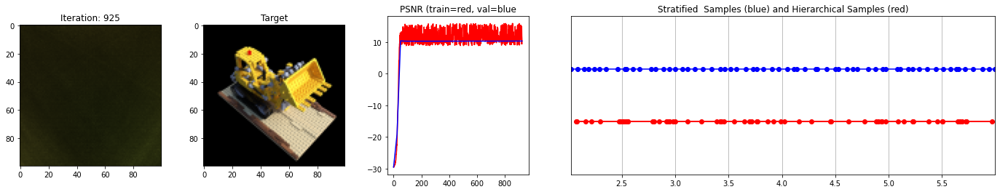

 10%|▉         | 950/10000 [03:59<36:38,  4.12it/s]

Loss: 0.09210345149040222


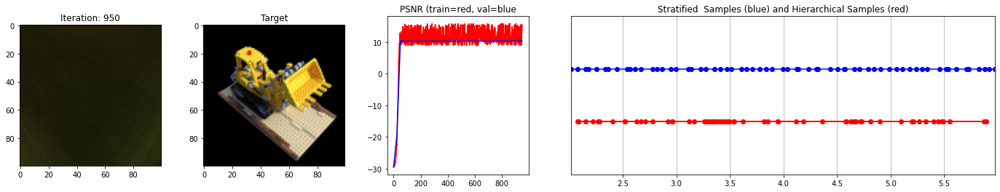

 10%|▉         | 975/10000 [04:06<36:30,  4.12it/s]  

Loss: 0.09203951805830002


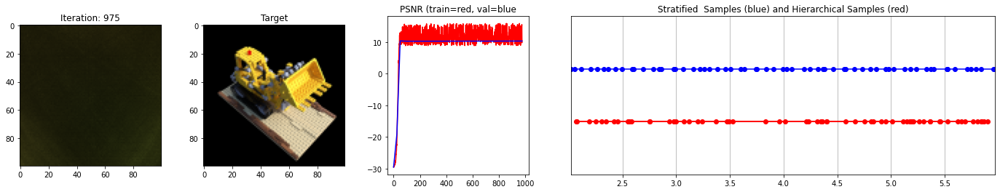

 10%|█         | 1000/10000 [04:12<36:26,  4.12it/s]

Loss: 0.09201401472091675


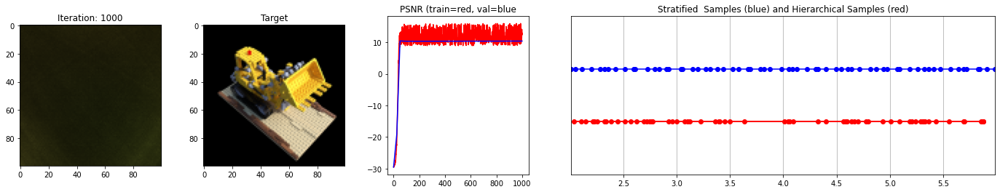

 10%|█         | 1025/10000 [04:19<36:20,  4.12it/s]

Loss: 0.09193616360425949


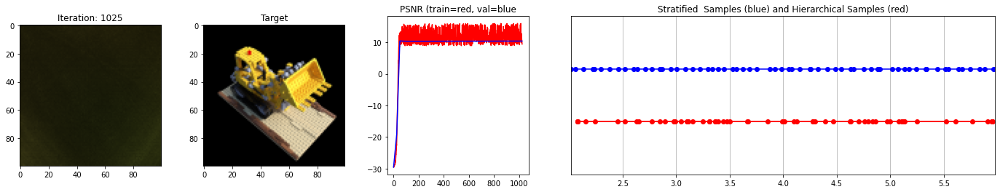

 10%|█         | 1050/10000 [04:25<36:13,  4.12it/s]

Loss: 0.09179621934890747


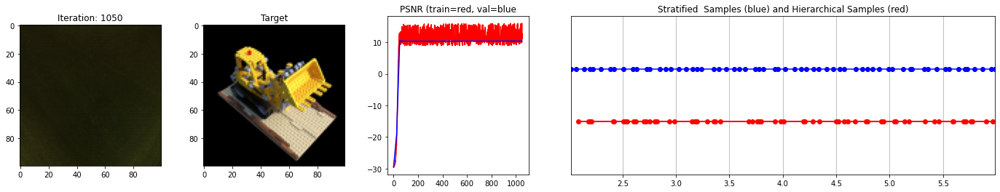

 11%|█         | 1075/10000 [04:32<36:08,  4.12it/s]

Loss: 0.09177008271217346


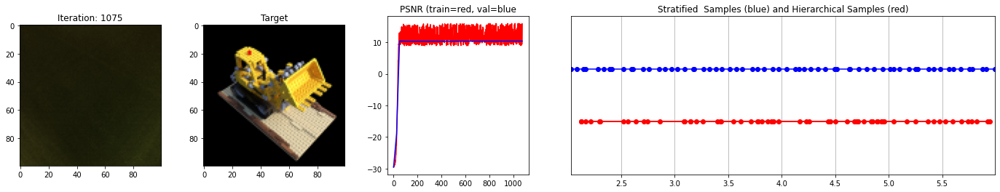

 11%|█         | 1100/10000 [04:38<36:00,  4.12it/s]

Loss: 0.09157460927963257


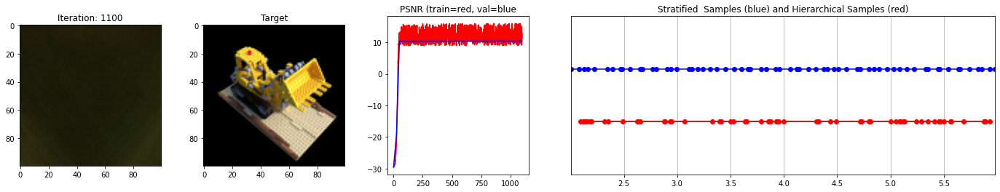

 11%|█▏        | 1125/10000 [04:45<35:57,  4.11it/s]

Loss: 0.0914553850889206


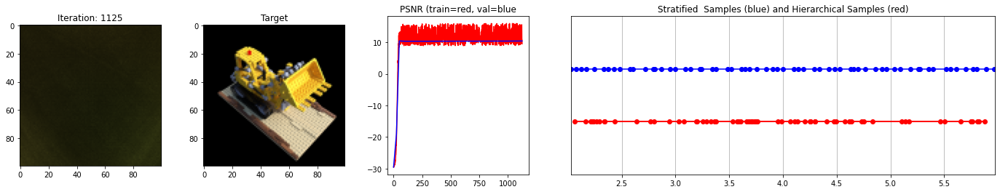

 12%|█▏        | 1150/10000 [04:52<35:49,  4.12it/s]

Loss: 0.09133882075548172


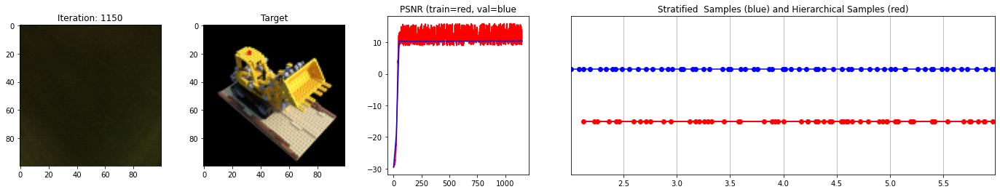

 12%|█▏        | 1175/10000 [04:58<35:43,  4.12it/s]

Loss: 0.0913233608007431


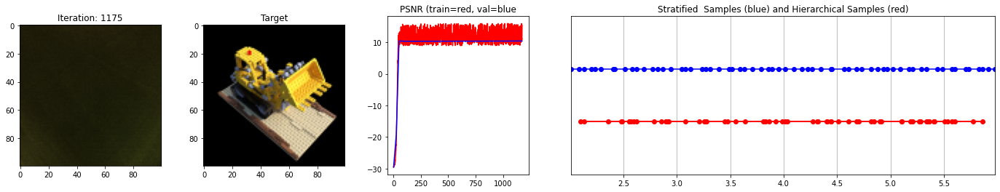

 12%|█▏        | 1200/10000 [05:05<35:37,  4.12it/s]

Loss: 0.09123994410037994


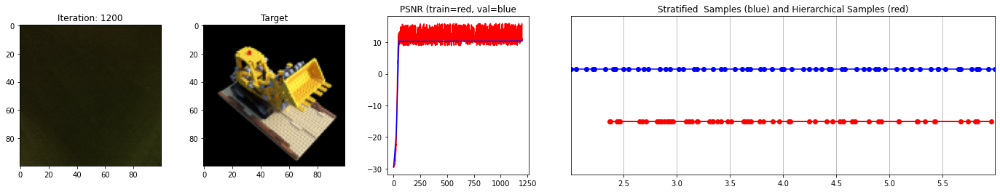

 12%|█▏        | 1225/10000 [05:11<35:31,  4.12it/s]

Loss: 0.09123919159173965


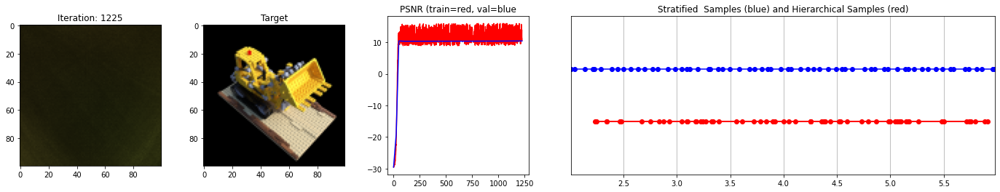

 12%|█▎        | 1250/10000 [05:18<35:25,  4.12it/s]

Loss: 0.09108217060565948


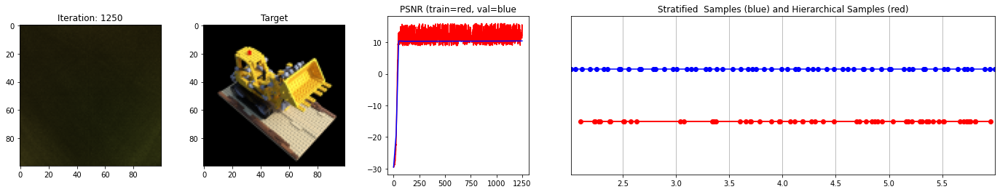

 13%|█▎        | 1275/10000 [05:24<35:17,  4.12it/s]

Loss: 0.09106354415416718


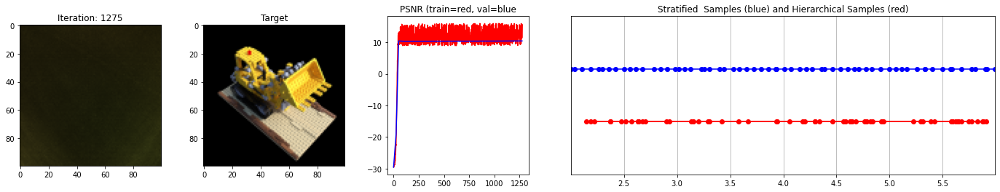

 13%|█▎        | 1300/10000 [05:31<35:14,  4.11it/s]

Loss: 0.09105300158262253


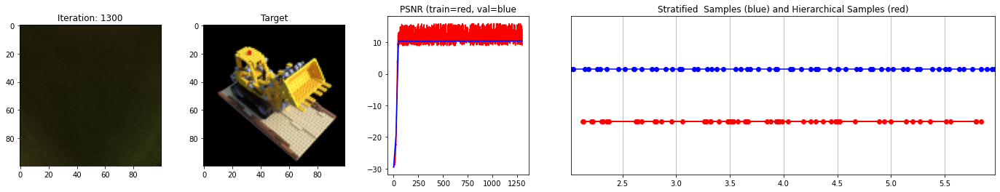

 13%|█▎        | 1325/10000 [05:37<35:05,  4.12it/s]

Loss: 0.09094560891389847


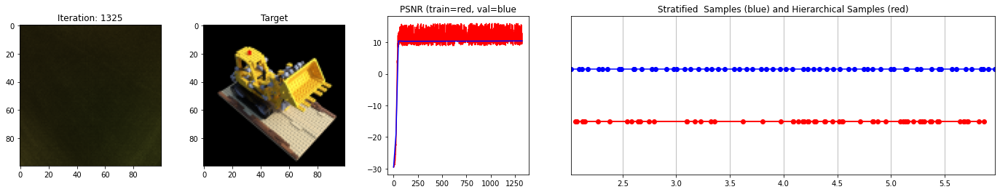

 14%|█▎        | 1350/10000 [05:44<35:00,  4.12it/s]

Loss: 0.09080144017934799


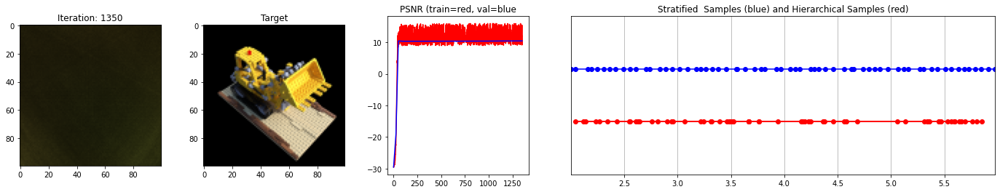

 14%|█▍        | 1375/10000 [05:50<34:53,  4.12it/s]

Loss: 0.09060389548540115


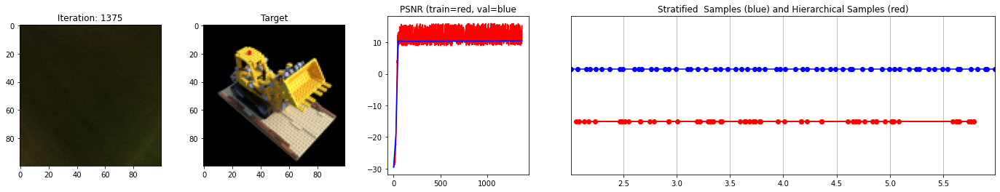

 14%|█▍        | 1400/10000 [05:57<34:50,  4.11it/s]

Loss: 0.09056097269058228


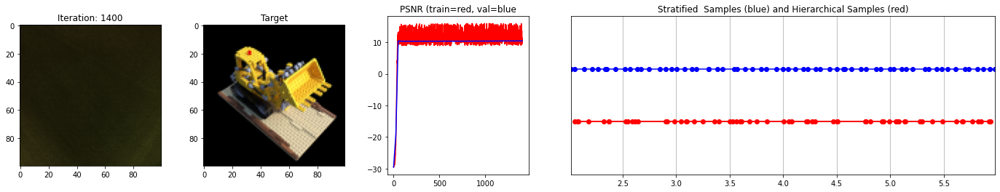

 14%|█▍        | 1425/10000 [06:03<34:42,  4.12it/s]

Loss: 0.09046738594770432


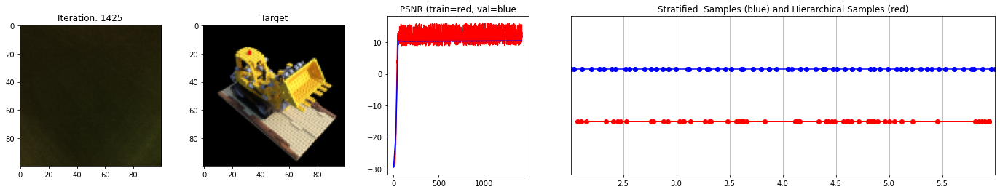

 14%|█▍        | 1450/10000 [06:10<34:35,  4.12it/s]

Loss: 0.0902499258518219


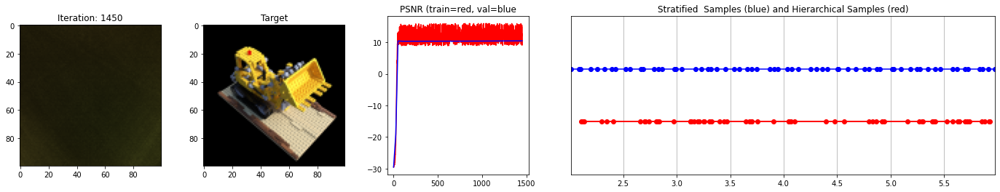

 15%|█▍        | 1475/10000 [06:17<34:32,  4.11it/s]

Loss: 0.09007879346609116


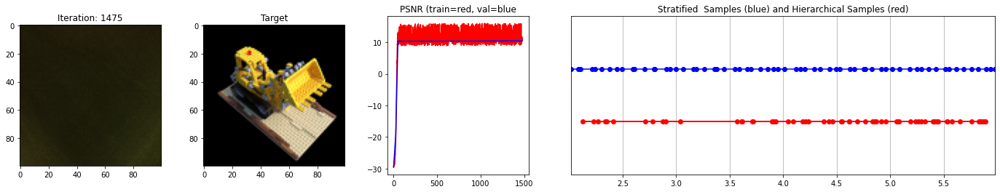

 15%|█▌        | 1500/10000 [06:23<34:25,  4.12it/s]

Loss: 0.08995795249938965


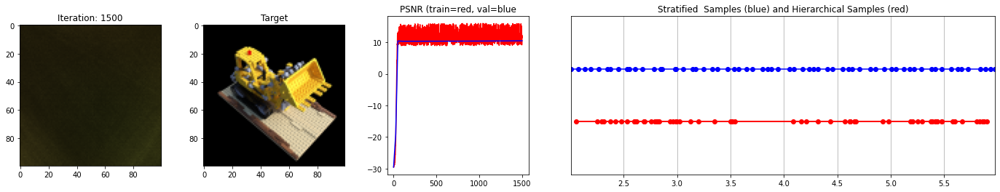

 15%|█▌        | 1525/10000 [06:30<34:19,  4.12it/s]

Loss: 0.08991115540266037


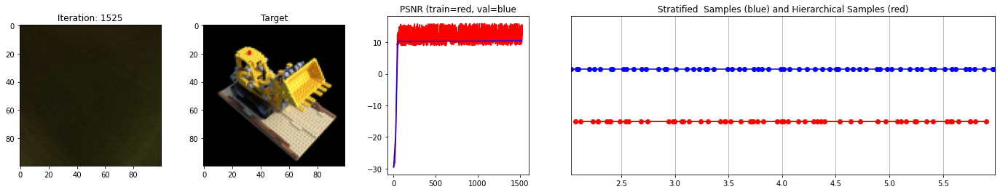

 16%|█▌        | 1550/10000 [06:36<34:13,  4.12it/s]

Loss: 0.08981600403785706


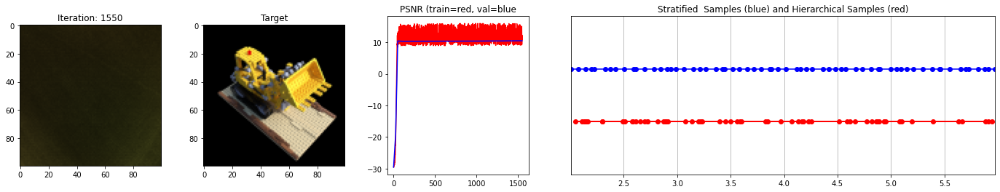

 16%|█▌        | 1575/10000 [06:43<34:10,  4.11it/s]

Loss: 0.08976627886295319


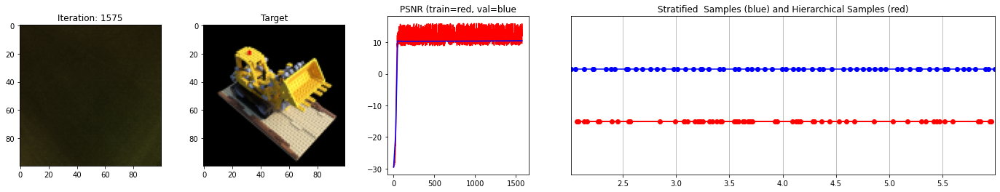

 16%|█▌        | 1600/10000 [06:49<34:00,  4.12it/s]

Loss: 0.08969063311815262


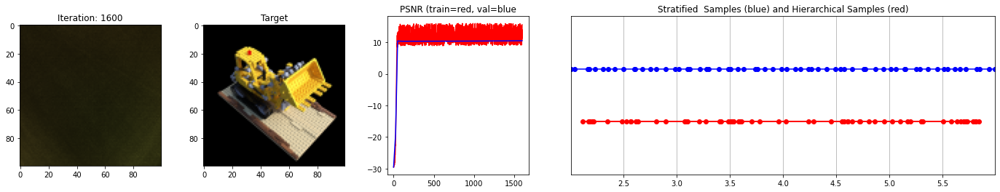

 16%|█▋        | 1625/10000 [06:56<33:55,  4.11it/s]

Loss: 0.08954299986362457


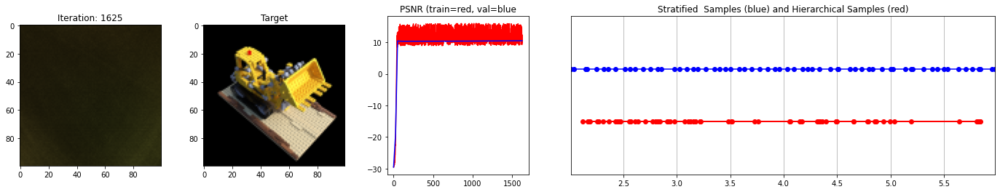

 16%|█▋        | 1650/10000 [07:02<33:48,  4.12it/s]

Loss: 0.08939949423074722


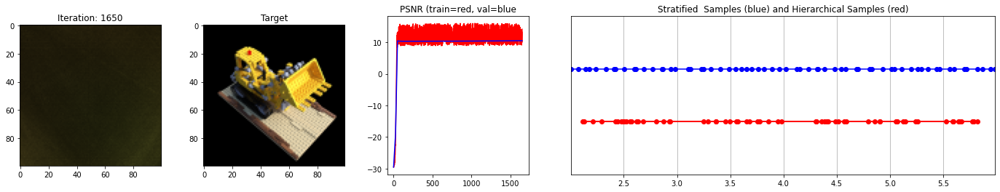

 17%|█▋        | 1675/10000 [07:09<33:44,  4.11it/s]

Loss: 0.0892731323838234


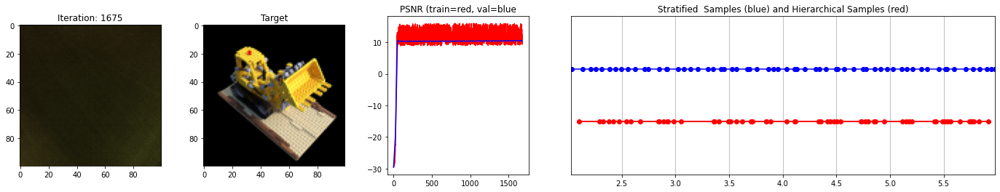

 17%|█▋        | 1700/10000 [07:15<33:38,  4.11it/s]

Loss: 0.08912602812051773


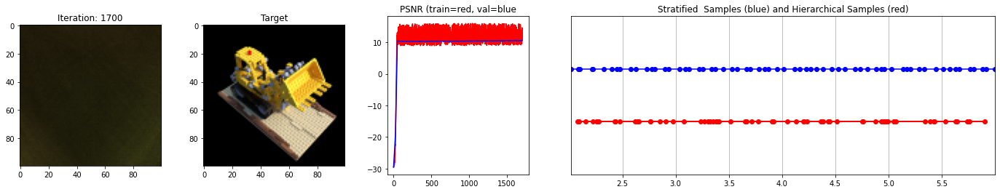

 17%|█▋        | 1725/10000 [07:22<33:32,  4.11it/s]

Loss: 0.08902855962514877


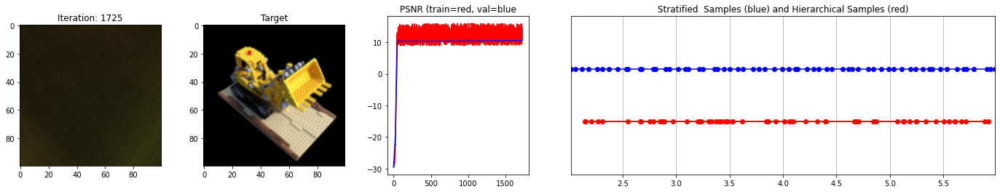

 18%|█▊        | 1750/10000 [07:29<33:24,  4.12it/s]

Loss: 0.08916159719228745


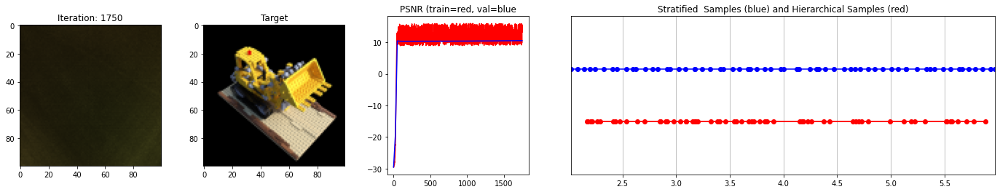

 18%|█▊        | 1775/10000 [07:35<33:18,  4.12it/s]

Loss: 0.08904110640287399


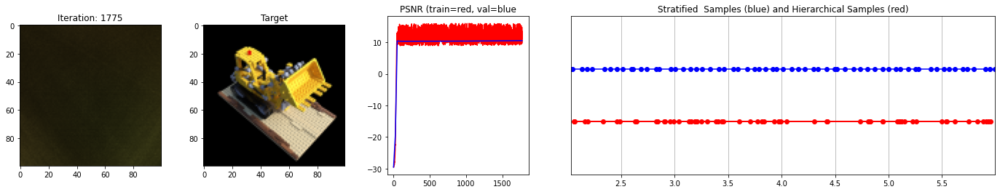

 18%|█▊        | 1800/10000 [07:42<33:11,  4.12it/s]

Loss: 0.0888962671160698


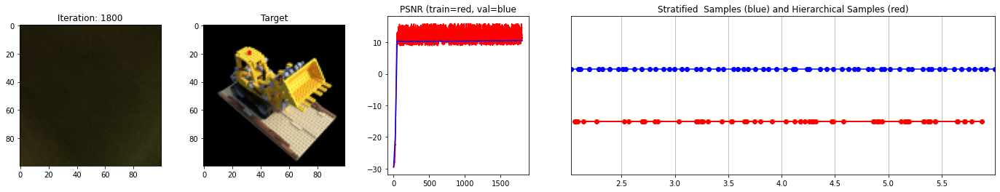

 18%|█▊        | 1825/10000 [07:48<33:04,  4.12it/s]

Loss: 0.0888431966304779


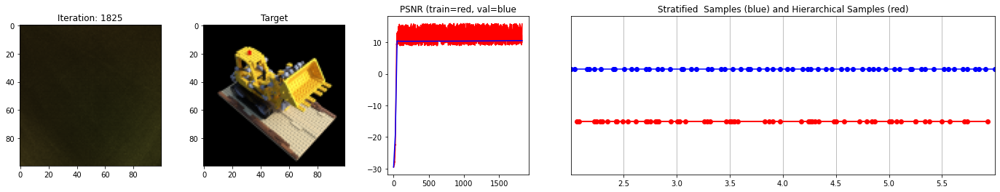

 18%|█▊        | 1850/10000 [07:55<32:59,  4.12it/s]

Loss: 0.08866529166698456


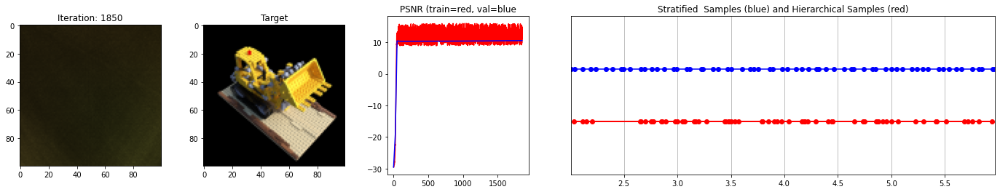

 19%|█▉        | 1875/10000 [08:01<32:53,  4.12it/s]

Loss: 0.08853623270988464


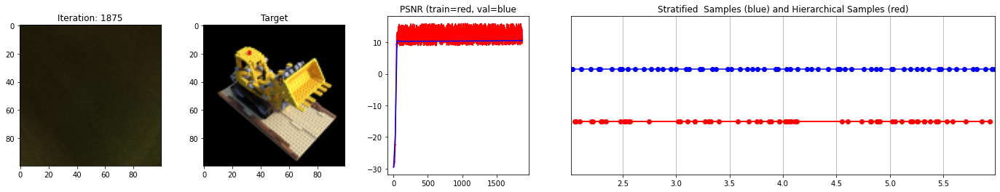

 19%|█▉        | 1900/10000 [08:08<32:48,  4.11it/s]

Loss: 0.08837592601776123


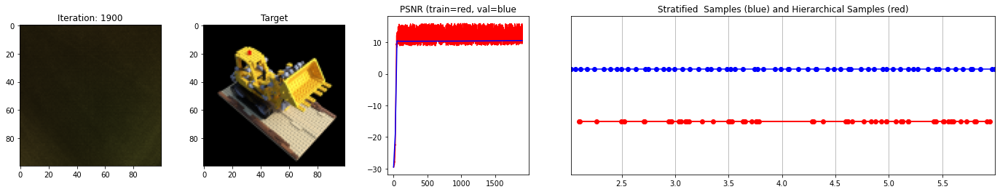

 19%|█▉        | 1925/10000 [08:14<32:41,  4.12it/s]

Loss: 0.08837879449129105


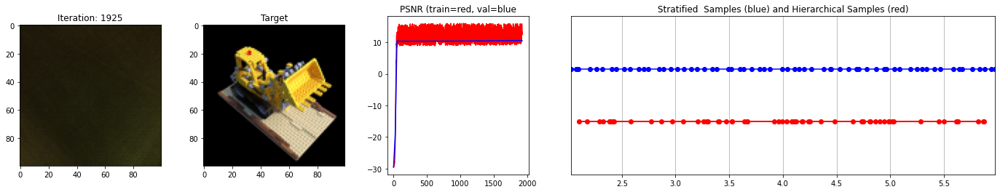

 20%|█▉        | 1950/10000 [08:21<32:37,  4.11it/s]

Loss: 0.0886031910777092


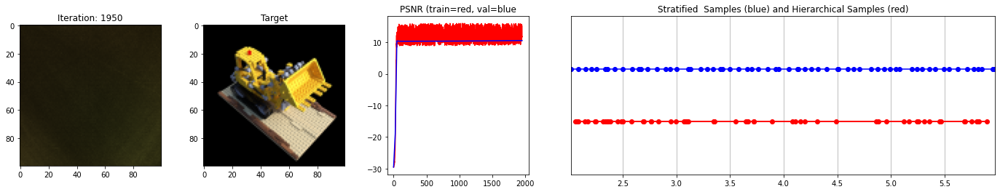

 20%|█▉        | 1975/10000 [08:27<32:29,  4.12it/s]

Loss: 0.08838904649019241


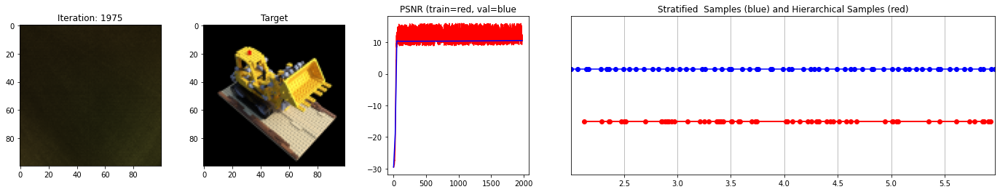

 20%|██        | 2000/10000 [08:34<32:22,  4.12it/s]

Loss: 0.08816587924957275


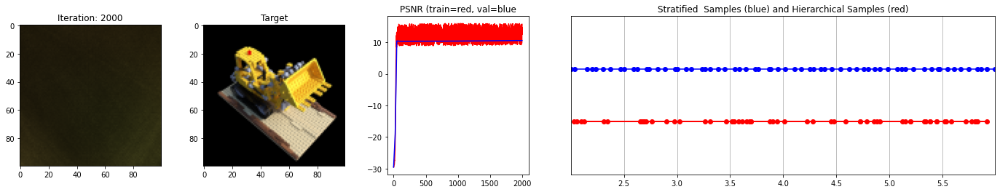

 20%|██        | 2025/10000 [08:41<32:16,  4.12it/s]

Loss: 0.08793456107378006


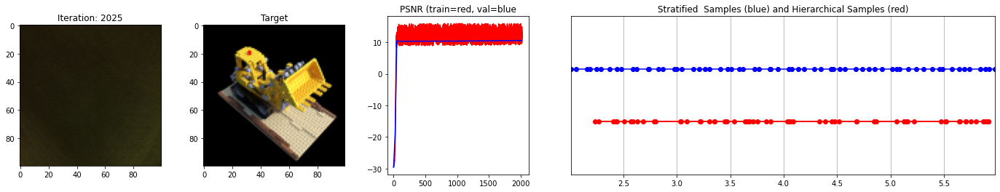

 20%|██        | 2050/10000 [08:47<32:10,  4.12it/s]

Loss: 0.08792410045862198


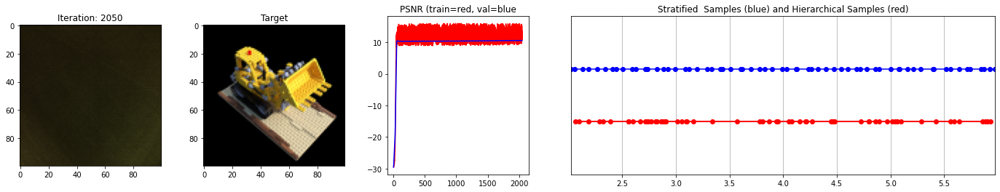

 21%|██        | 2075/10000 [08:54<32:05,  4.11it/s]

Loss: 0.08790239691734314


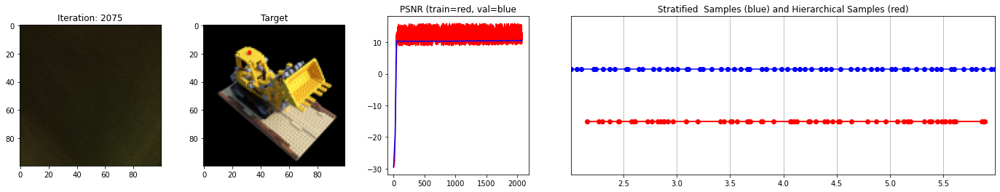

 21%|██        | 2100/10000 [09:00<31:58,  4.12it/s]

Loss: 0.08773673325777054


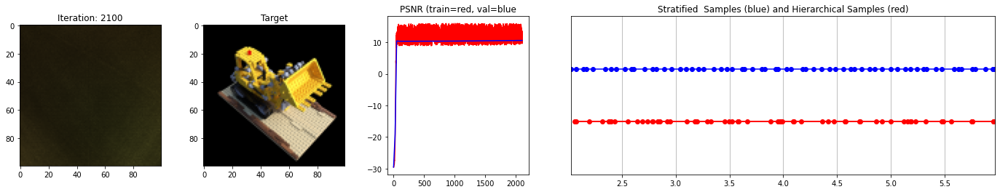

 21%|██▏       | 2125/10000 [09:07<31:53,  4.11it/s]

Loss: 0.087429478764534


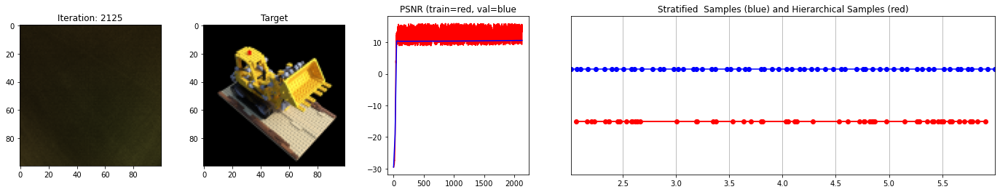

 22%|██▏       | 2150/10000 [09:13<31:46,  4.12it/s]

Loss: 0.08738706260919571


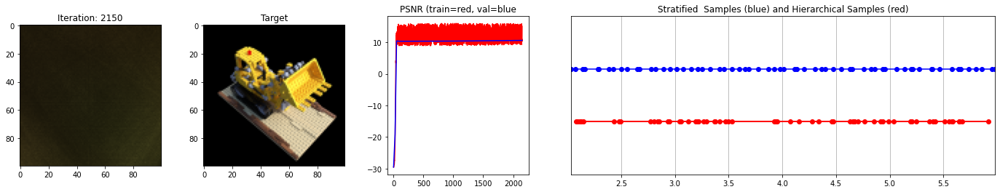

 22%|██▏       | 2175/10000 [09:20<31:43,  4.11it/s]

Loss: 0.08720995485782623


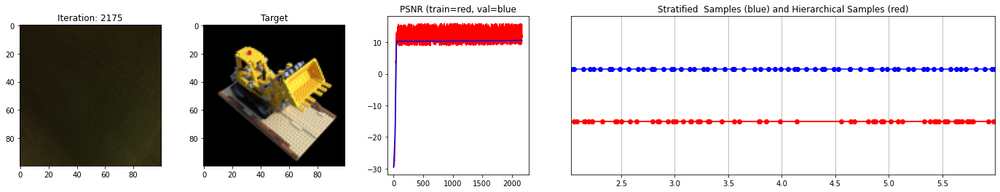

 22%|██▏       | 2200/10000 [09:26<31:36,  4.11it/s]

Loss: 0.08725246787071228


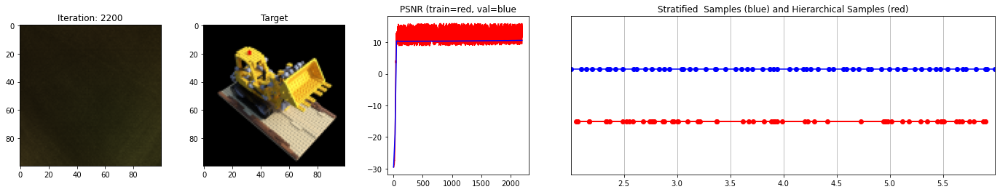

 22%|██▏       | 2225/10000 [09:33<31:28,  4.12it/s]

Loss: 0.08705748617649078


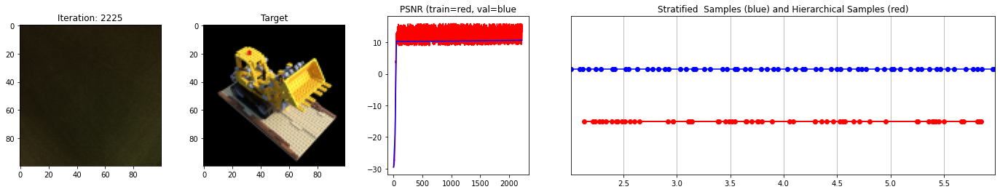

 22%|██▎       | 2250/10000 [09:39<31:22,  4.12it/s]

Loss: 0.08718372136354446


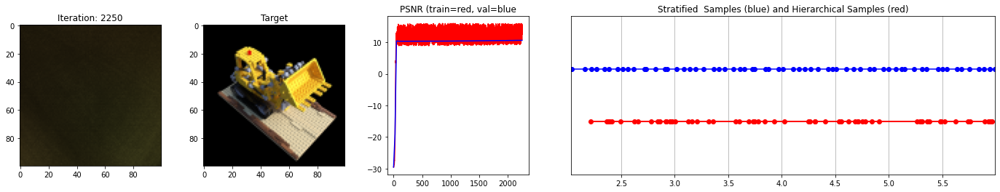

 23%|██▎       | 2275/10000 [09:46<31:17,  4.11it/s]

Loss: 0.08737605810165405


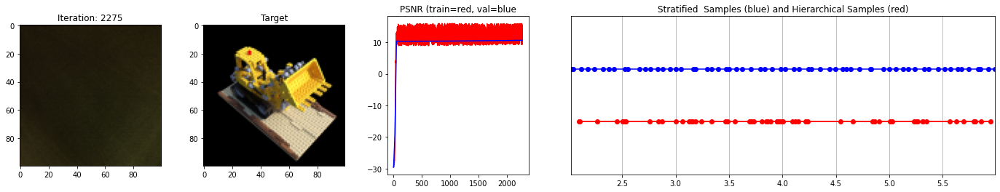

 23%|██▎       | 2300/10000 [09:53<31:10,  4.12it/s]

Loss: 0.0870450958609581


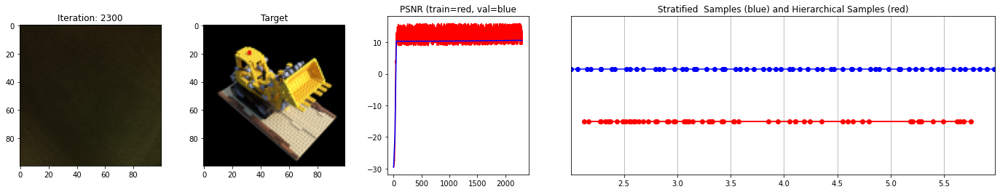

 23%|██▎       | 2325/10000 [09:59<31:03,  4.12it/s]

Loss: 0.08658253401517868


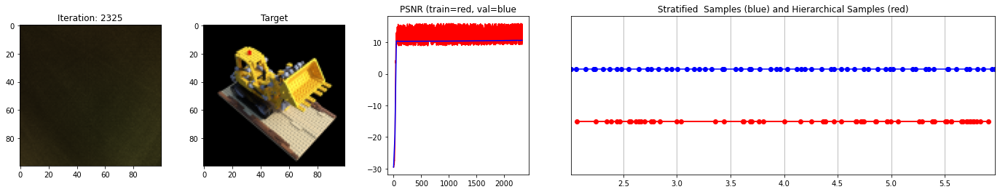

 24%|██▎       | 2350/10000 [10:06<30:58,  4.12it/s]

Loss: 0.08626611530780792


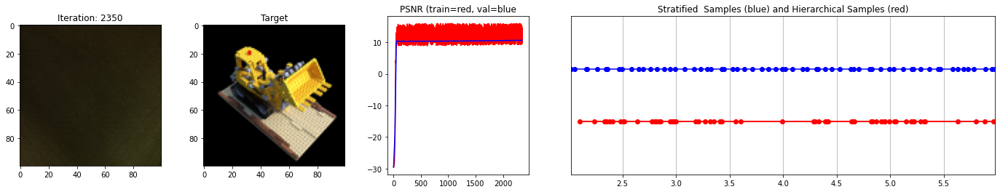

 24%|██▍       | 2375/10000 [10:12<30:51,  4.12it/s]

Loss: 0.08622002601623535


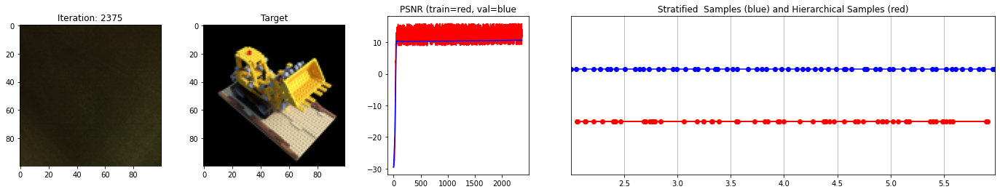

 24%|██▍       | 2400/10000 [10:19<30:46,  4.12it/s]

Loss: 0.08604687452316284


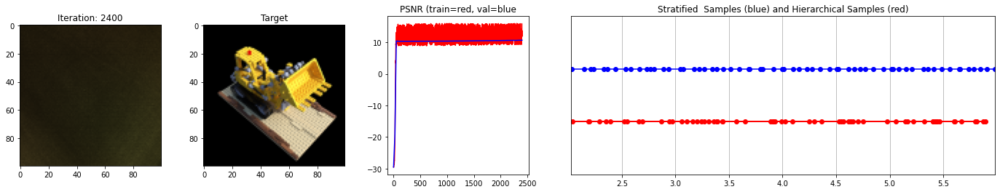

 24%|██▍       | 2425/10000 [10:25<30:39,  4.12it/s]

Loss: 0.08578643202781677


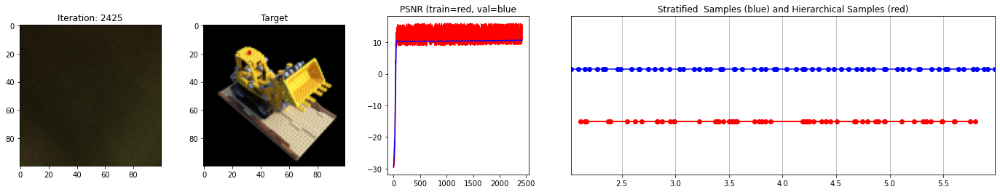

 24%|██▍       | 2450/10000 [10:32<30:32,  4.12it/s]

Loss: 0.08540104329586029


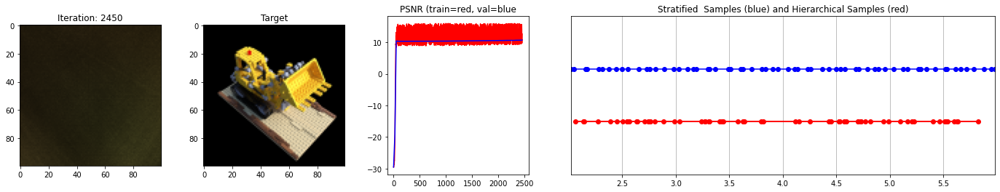

 25%|██▍       | 2475/10000 [10:38<30:26,  4.12it/s]

Loss: 0.08515596389770508


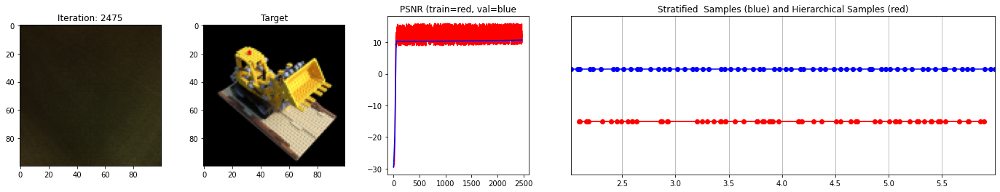

 25%|██▌       | 2500/10000 [10:45<30:27,  4.10it/s]

Loss: 0.08514980226755142


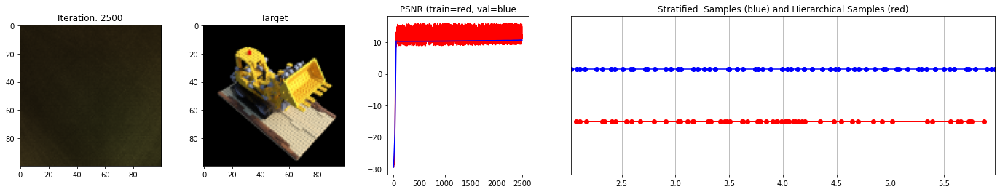

 25%|██▌       | 2525/10000 [10:52<30:15,  4.12it/s]

Loss: 0.08490065485239029


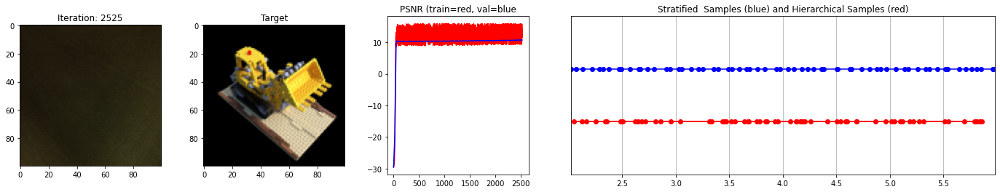

 26%|██▌       | 2550/10000 [10:58<30:08,  4.12it/s]

Loss: 0.08464396744966507


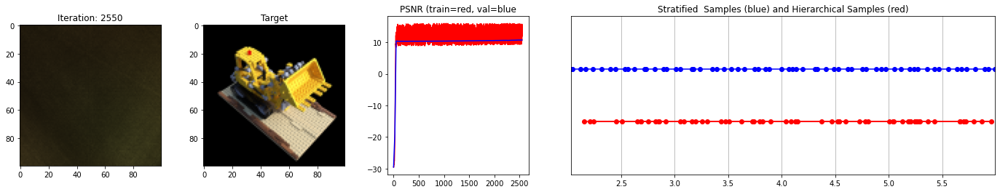

 26%|██▌       | 2575/10000 [11:05<30:03,  4.12it/s]

Loss: 0.08471772819757462


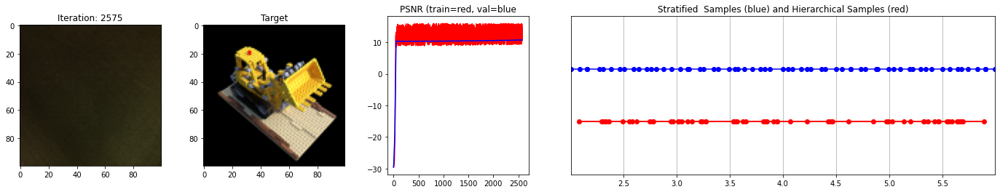

 26%|██▌       | 2600/10000 [11:11<29:59,  4.11it/s]

Loss: 0.08444330096244812


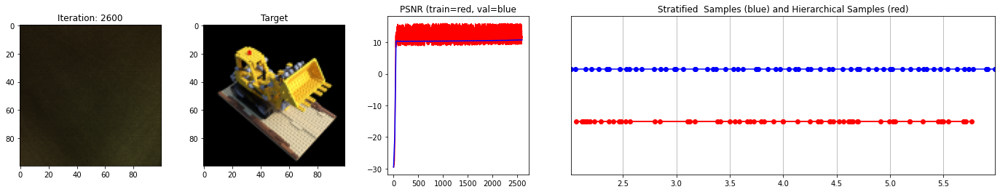

 26%|██▋       | 2625/10000 [11:18<29:51,  4.12it/s]

Loss: 0.08421529829502106


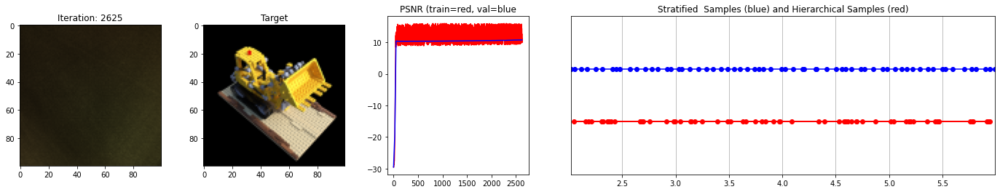

 26%|██▋       | 2650/10000 [11:24<29:44,  4.12it/s]

Loss: 0.0839693546295166


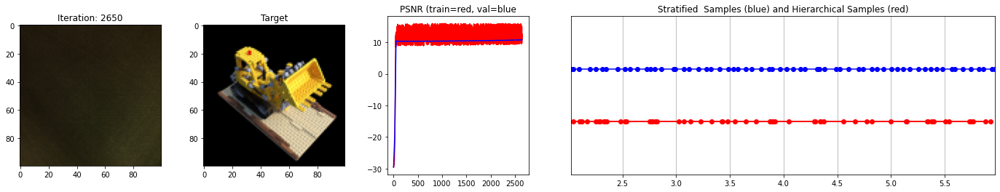

 27%|██▋       | 2675/10000 [11:31<29:40,  4.11it/s]

Loss: 0.08375860750675201


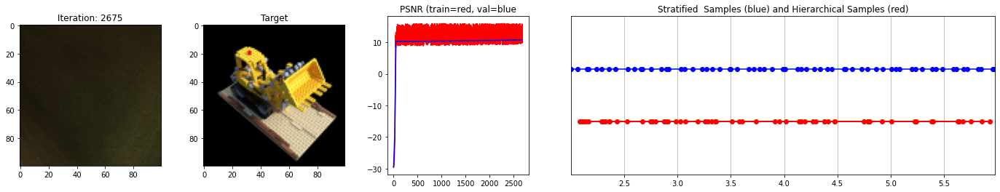

 27%|██▋       | 2700/10000 [11:37<29:32,  4.12it/s]

Loss: 0.08360051363706589


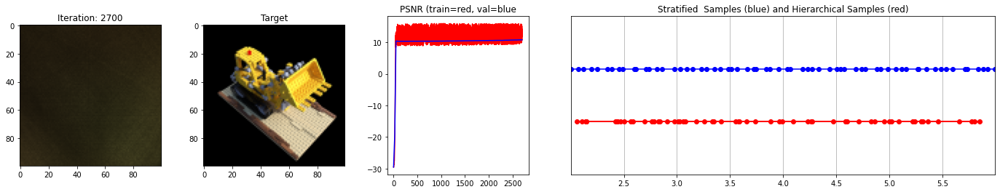

 27%|██▋       | 2725/10000 [11:44<29:28,  4.11it/s]

Loss: 0.08346793055534363


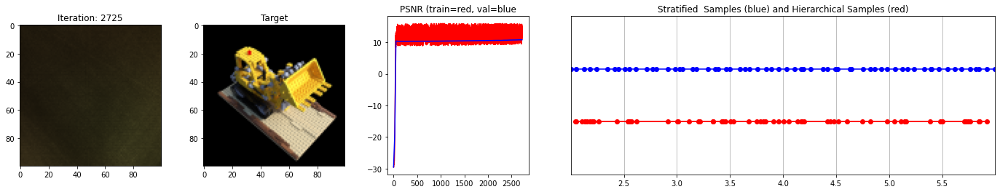

 28%|██▊       | 2750/10000 [11:50<29:20,  4.12it/s]

Loss: 0.08323250710964203


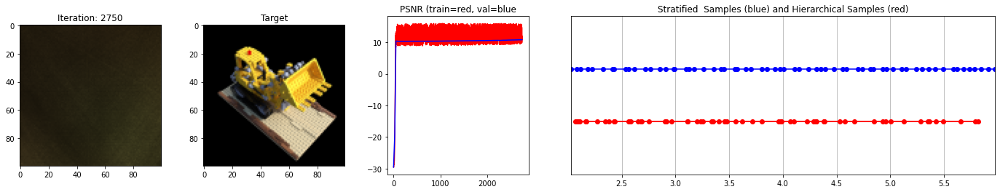

 28%|██▊       | 2775/10000 [11:57<29:15,  4.11it/s]

Loss: 0.08264230936765671


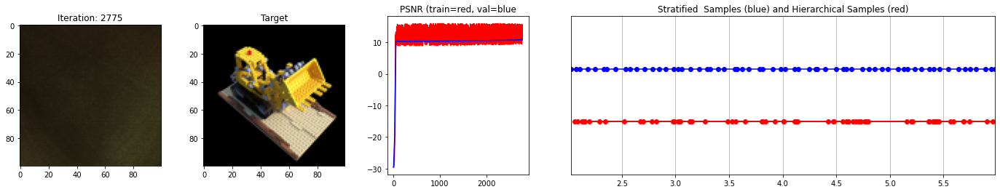

 28%|██▊       | 2800/10000 [12:04<29:08,  4.12it/s]

Loss: 0.08232835680246353


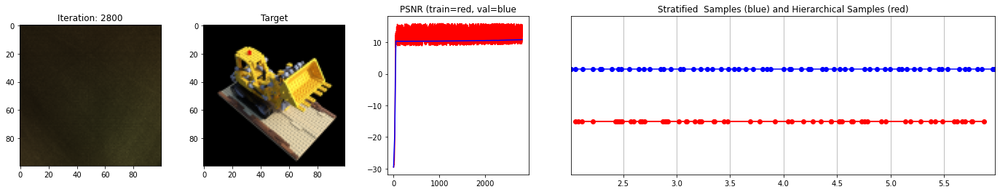

 28%|██▊       | 2825/10000 [12:10<29:02,  4.12it/s]

Loss: 0.08212216943502426


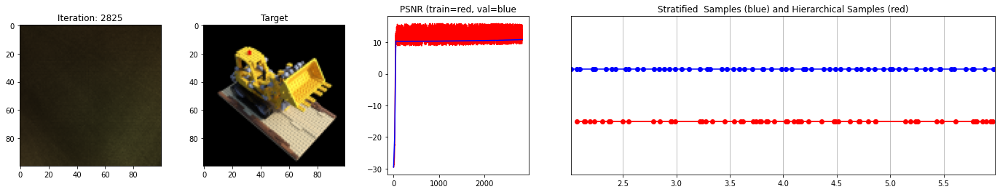

 28%|██▊       | 2850/10000 [12:17<28:57,  4.12it/s]

Loss: 0.08222994953393936


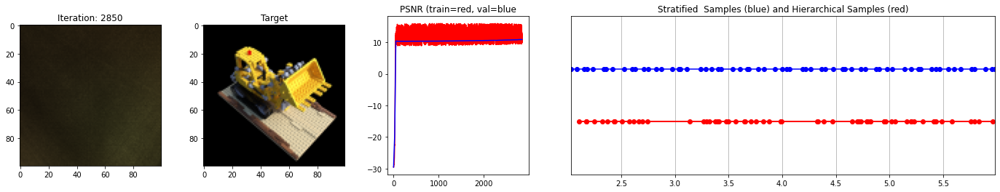

 29%|██▉       | 2875/10000 [12:23<28:52,  4.11it/s]

Loss: 0.08207090944051743


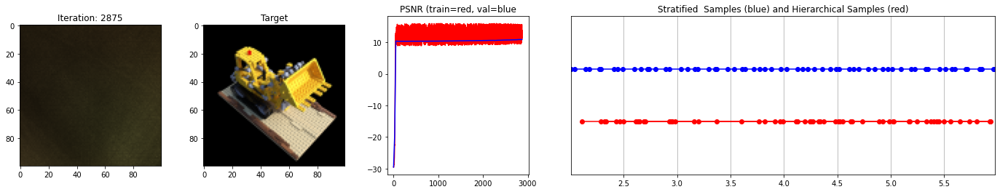

 29%|██▉       | 2900/10000 [12:30<28:44,  4.12it/s]

Loss: 0.08166705071926117


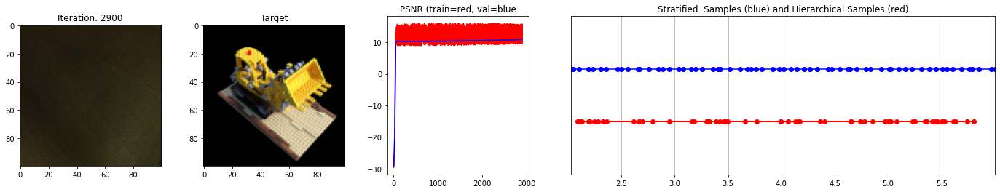

 29%|██▉       | 2925/10000 [12:36<28:38,  4.12it/s]

Loss: 0.08136492967605591


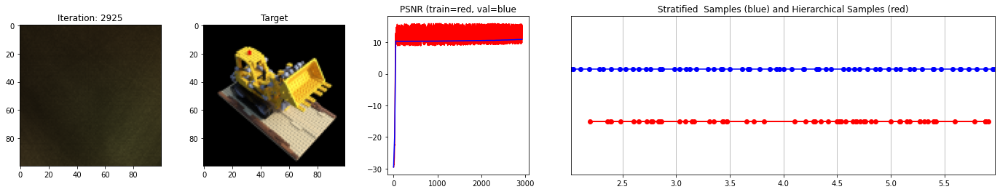

 30%|██▉       | 2950/10000 [12:43<28:35,  4.11it/s]

Loss: 0.08142755925655365


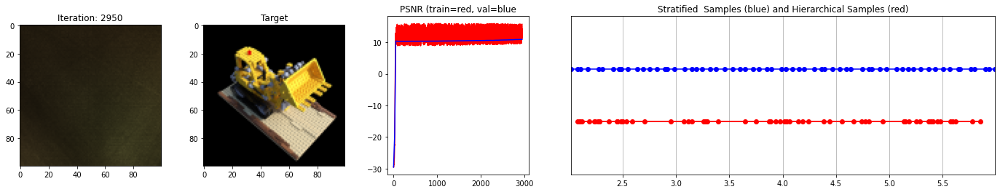

 30%|██▉       | 2975/10000 [12:49<28:27,  4.11it/s]

Loss: 0.08101058006286621


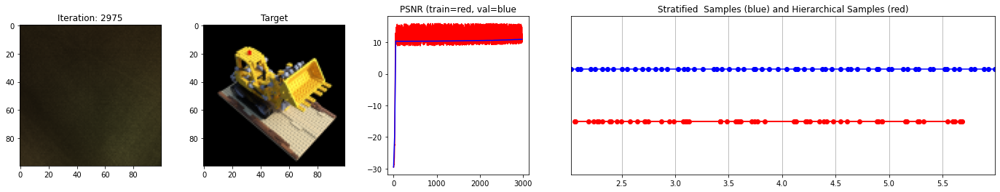

 30%|███       | 3000/10000 [12:56<28:19,  4.12it/s]

Loss: 0.08065246790647507


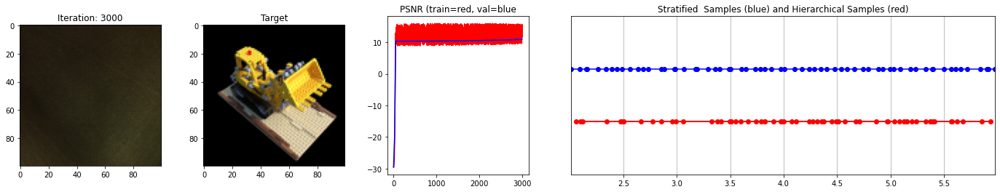

 30%|███       | 3025/10000 [13:02<28:15,  4.11it/s]

Loss: 0.0809062197804451


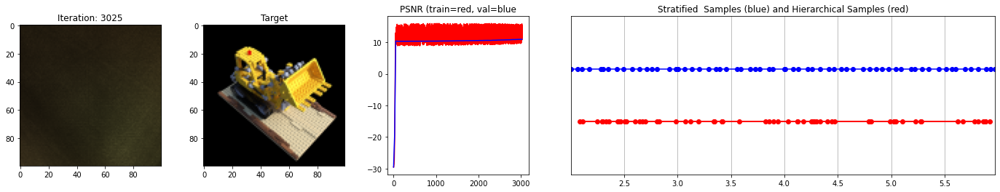

 30%|███       | 3050/10000 [13:09<28:07,  4.12it/s]

Loss: 0.08110101521015167


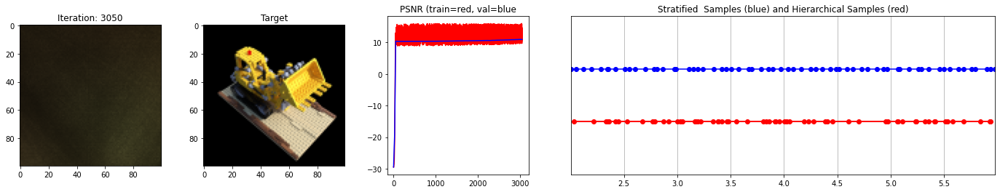

 31%|███       | 3075/10000 [13:16<28:04,  4.11it/s]

Loss: 0.08124940097332001


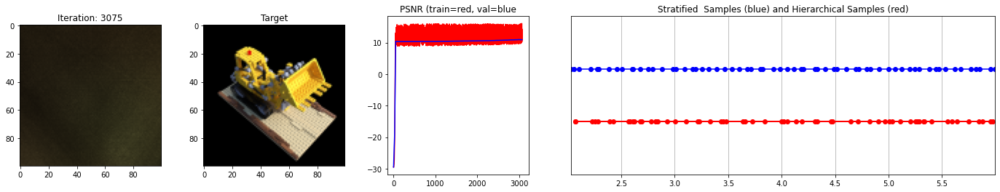

 31%|███       | 3100/10000 [13:22<27:55,  4.12it/s]

Loss: 0.08064599335193634


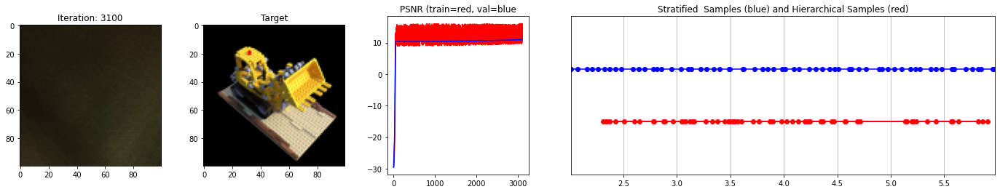

 31%|███▏      | 3125/10000 [13:29<27:49,  4.12it/s]

Loss: 0.08016015589237213


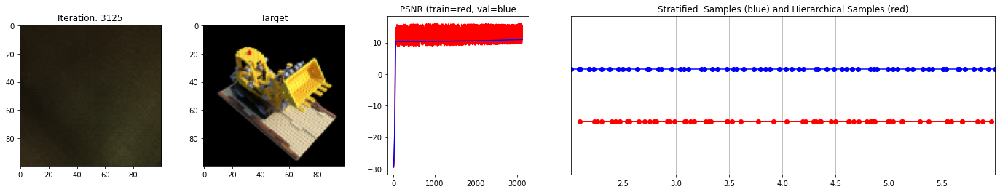

 32%|███▏      | 3150/10000 [13:35<27:43,  4.12it/s]

Loss: 0.07968165725469589


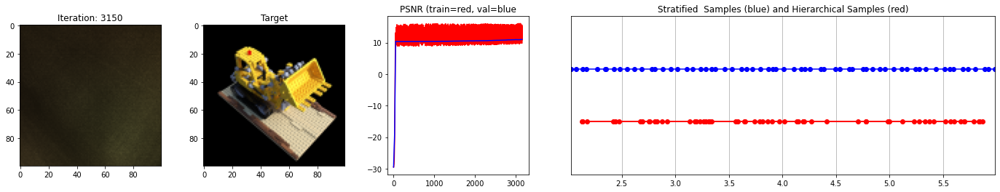

 32%|███▏      | 3175/10000 [13:42<27:37,  4.12it/s]

Loss: 0.0794459879398346


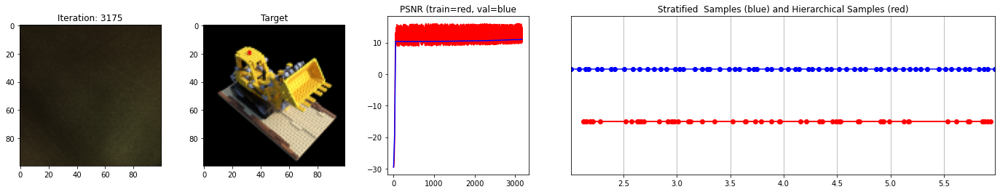

 32%|███▏      | 3200/10000 [13:48<27:31,  4.12it/s]

Loss: 0.07949332892894745


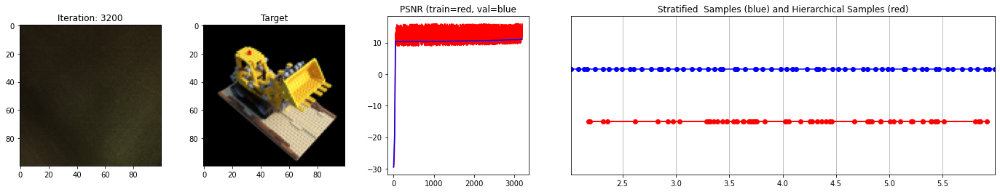

 32%|███▏      | 3225/10000 [13:55<27:25,  4.12it/s]

Loss: 0.07945714890956879


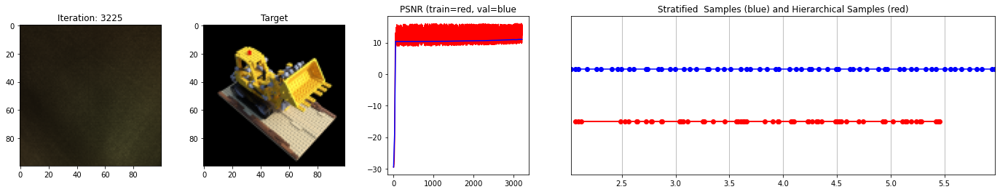

 32%|███▎      | 3250/10000 [14:01<27:20,  4.12it/s]

Loss: 0.0791052058339119


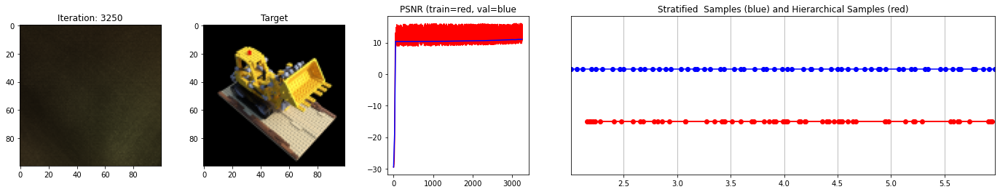

 33%|███▎      | 3274/10000 [14:08<27:16,  4.11it/s]

In [ ]:
# Run training session(s)
for _ in range(n_restarts):
  model, fine_model, encode, encode_viewdirs, optimizer, warmup_stopper = init_models()
  success, train_psnrs, val_psnrs = train()
  if success and val_psnrs[-1] >= warmup_min_fitness:
    print('Training successful!')
    break

print('')
print(f'Done!')

In [ ]:
### INTERACTIVE VISUALIZATION

%matplotlib inline
from ipywidgets import interactive, widgets


trans_t = lambda t : tf.convert_to_tensor([
    [1,0,0,0],
    [0,1,0,0],
    [0,0,1,t],
    [0,0,0,1],
], dtype=tf.float32)

rot_phi = lambda phi : tf.convert_to_tensor([
    [1,0,0,0],
    [0,tf.cos(phi),-tf.sin(phi),0],
    [0,tf.sin(phi), tf.cos(phi),0],
    [0,0,0,1],
], dtype=tf.float32)

rot_theta = lambda th : tf.convert_to_tensor([
    [tf.cos(th),0,-tf.sin(th),0],
    [0,1,0,0],
    [tf.sin(th),0, tf.cos(th),0],
    [0,0,0,1],
], dtype=tf.float32)


def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius)
    c2w = rot_phi(phi/180.*np.pi) @ c2w
    c2w = rot_theta(theta/180.*np.pi) @ c2w
    c2w = np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]]) @ c2w
    return c2w


def f(**kwargs):
    c2w = pose_spherical(**kwargs)
    rays_o, rays_d = get_rays(H, W, focal, c2w[:3,:4])
    rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., N_samples=N_samples)
    img = np.clip(rgb,0,1)
    
    plt.figure(2, figsize=(20,6))
    plt.imshow(img)
    plt.show()
    

sldr = lambda v, mi, ma: widgets.FloatSlider(
    value=v,
    min=mi,
    max=ma,
    step=.01,
)

names = [
    ['theta', [100., 0., 360]],
    ['phi', [-30., -90, 0]],
    ['radius', [4., 3., 5.]],
]

interactive_plot = interactive(f, **{s[0] : sldr(*s[1]) for s in names})
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

In [ ]:
### Render 360 Video

frames = []
for th in tqdm(np.linspace(0., 360., 120, endpoint=False)):
    c2w = pose_spherical(th, -30., 4.)
    rays_o, rays_d = get_rays(H, W, focal, c2w[:3,:4])
    rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., N_samples=N_samples)
    frames.append((255*np.clip(rgb,0,1)).astype(np.uint8))

import imageio
f = 'video.mp4'
imageio.mimwrite(f, frames, fps=30, quality=7)

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls autoplay loop>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)